In [ ]:
import pickle
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import copy
import matplotlib.animation as animation
import pandas as pd
import time
import itertools

In [8]:
sigma=1

In [ ]:
# Load the networks from the gpickle file
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

In [ ]:
Options are:




NewYork
London
Shanghai
Paris
Madrid
Tokyo
Delhi
Berlin
Chicago
Santiago
Boston
Milan
Oslo
Stockholm
Vienna
Valencia
WashingtonDc
BuenosAires
Toronto
Rome
Rotterdam
Montreal
Athens
Cairo
Lille
Brussels
Prague
Hyderabad
Dubai
Vancouver
Philadelphia
Lisbon
SanFrancisco
Nuremberg
Budapest
Bilbao
Lyon
Copenhagen
Amsterdam
Atlanta
Toulouse
Warsaw
Marseille
Naples
Kobe


In [9]:
agg_G=networks["NewYork"]

In [10]:
nodes_to_remove=np.random.choice(list(agg_G.nodes()), size=int(sigma*len(agg_G)), replace=False)

In [12]:
import time
import itertools

In [13]:
def calculate_network_performance(G):
    # sd = dict(nx.shortest_path_length(G))

    if G.number_of_nodes() == 0:  # Handle the case when the graph is empty
        return 0

    gc_size = [len(c) for c in sorted(nx.connected_components(G), key=len, reverse=True)][0]
    
    return gc_size




In [14]:

# Function to plot functionality ratios
def plot_functionality_ratio(recovery_performance):
    plt.figure(figsize=(10, 5))
    steps = list(range(1, len(recovery_performance) + 1))
    plt.plot(steps, recovery_performance, marker='o', linestyle='-', color='blue')
    plt.title('Network Functionality Ratio During Recovery')
    plt.xlabel('Step (Order of Node Recovery)')
    plt.ylabel('Network Functionality Ratio')
    plt.grid(True)
    plt.show()

## Degree based recovery

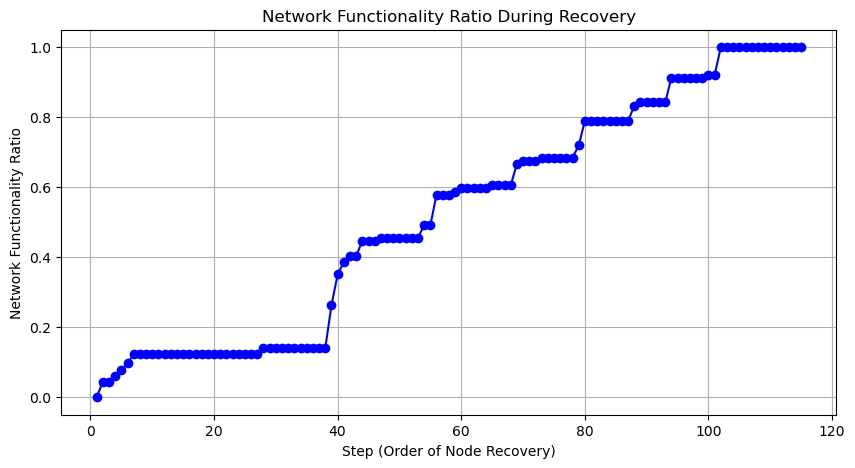

In [16]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import copy
import matplotlib.animation as animation


nodes_by_degree=[]

def simulate_recovery_degree(G,nodes_to_remove, recovery_measure='degree'):
    H = nx.Graph()  # Start with an empty graph
    seq_added_degree=[]
    # Calculate the initial performance for the functionality ratio
    initial_performance = calculate_network_performance(G)
    
    recovery_performance = []
    recovery_performance=[calculate_network_performance(H)/initial_performance]
    # Obtain degree centrality for the original graph
    degree = nx.degree_centrality(G)
    
    if recovery_measure == 'degree':
        nodes_sorted_by_degree = sorted(nodes_to_remove, key=lambda n: degree[n], reverse=True)
    else:
        raise ValueError("Invalid recovery measure. Use 'degree'.")
    for index, node in enumerate(nodes_sorted_by_degree):
        H.add_node(node, **G.nodes[node])
        H.add_edges_from(list(G.edges(node)))
        seq_added_degree.append(node)
        
        current_performance = calculate_network_performance(H)
        functionality_ratio = current_performance / initial_performance
        recovery_performance.append(functionality_ratio)
    
    return recovery_performance, seq_added_degree


## Betweeness based recovery

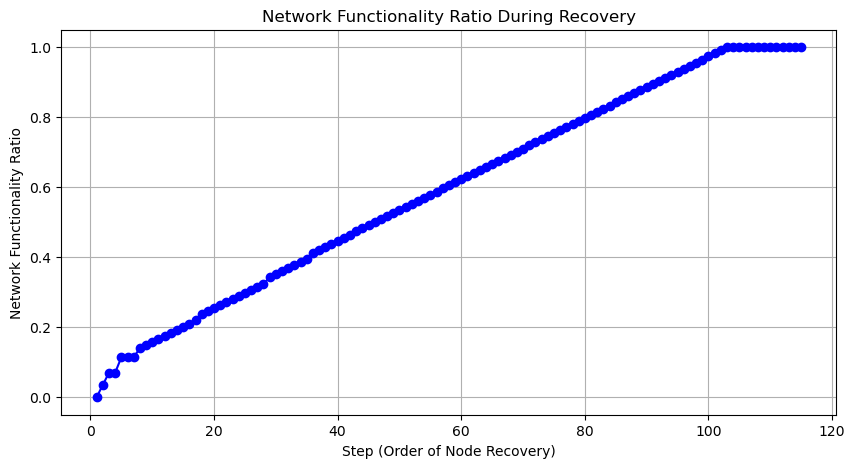

In [19]:
nodes_by_betweenness=[]
def simulate_recovery_betweenness(G, nodes_to_remove,recovery_measure='betweenness'):
    H = nx.Graph()  # Start with an empty graph
    seq_added_betweenness=[]
    # Calculate the initial performance for the functionality ratio
    initial_performance = calculate_network_performance(G)
    
    recovery_performance = []
    recovery_performance=[calculate_network_performance(H)/initial_performance]
    # Obtain betweenness centrality for the original graph
    betweenness = nx.betweenness_centrality(G)
    
    if recovery_measure == 'betweenness':
        nodes_sorted_by_betweenness = sorted(nodes_to_remove, key=lambda n: betweenness[n], reverse=True)
    else:
        raise ValueError("Invalid recovery measure. Use 'betweenness'.")
    for index, node in enumerate(nodes_sorted_by_betweenness):
        H.add_node(node, **G.nodes[node])
        H.add_edges_from(list(G.edges(node)))
        seq_added_betweenness.append(node)
        
        current_performance = calculate_network_performance(H)
        functionality_ratio = current_performance / initial_performance
        recovery_performance.append(functionality_ratio)
    
    return recovery_performance, seq_added_betweenness


## Greedy based recovery

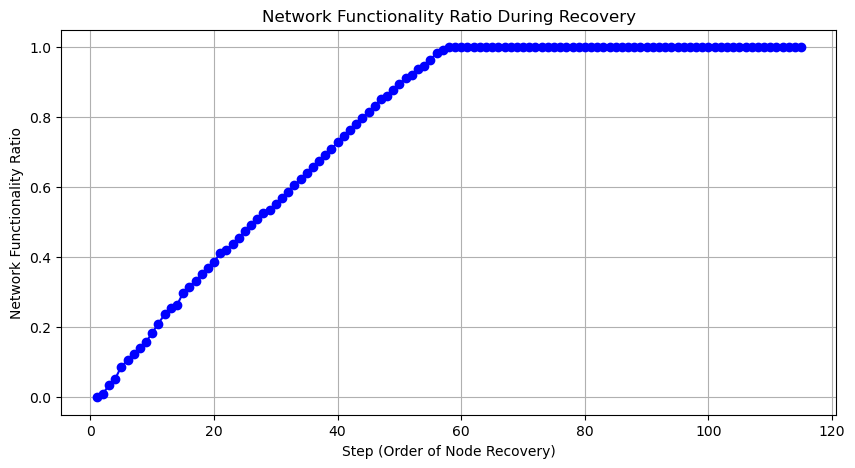

In [21]:
nodes_by_greedy = []

# Unified greedy recovery function
def simulate_recovery_greedy(G, nodes_to_remove):
    centrality = {n: G.degree[n] for n in G.nodes()}  # You can choose any centrality measure if needed
    nodes_sorted_by_centrality = sorted(nodes_to_remove, key=lambda n: centrality[n], reverse=True)
    
    H = nx.Graph()  # Start with an empty graph
    
    initial_performance = calculate_network_performance(G)
    recovery_performance = [0]  # Initial performance is zero since H is empty
    node_sequence = []
    
    remaining_nodes = set(nodes_to_remove)
    while remaining_nodes:
        best_performance = float('-inf')
        best_node = None

        # Test recovery for each remaining node
        for node in remaining_nodes:
            test_graph = copy.deepcopy(H)
            test_graph.add_node(node)
            # Reconnect with neighbors that are still in the graph
            for neighbor in G.neighbors(node):
                if neighbor in test_graph:
                    test_graph.add_edge(node, neighbor)

            # Calculate performance if this node were added back
            test_performance = calculate_network_performance(test_graph)
            if test_performance > best_performance:
                best_performance = test_performance
                best_node = node

        # Add the best node back to H for real
        if best_node is not None:
            H.add_node(best_node, **G.nodes[best_node])
            H.add_edges_from(list(G.edges(best_node)))
            node_sequence.append(best_node)
            functionality_ratio = best_performance / initial_performance
            recovery_performance.append(functionality_ratio)
            remaining_nodes.remove(best_node)

    return recovery_performance, node_sequence


## Random based recovery

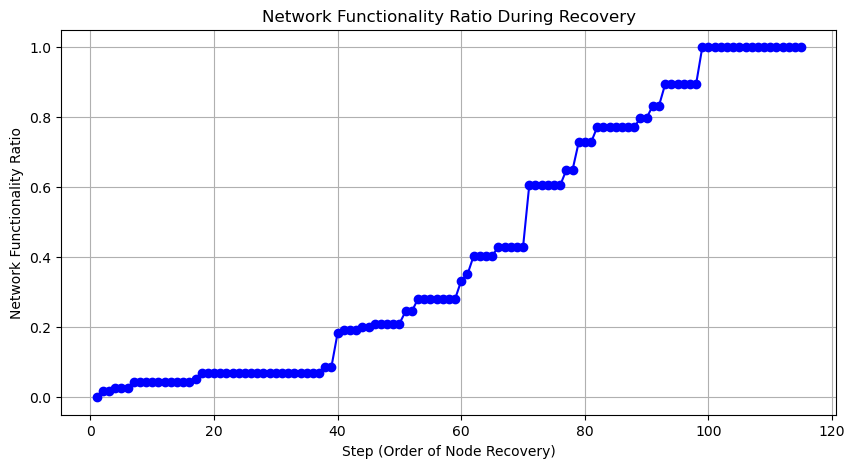

In [23]:
nodes_by_random=[]
def simulate_recovery_random(G, nodes_to_remove):
    H = nx.Graph()
    seq_added_random=[]
    initial_performance = calculate_network_performance(G)
    
    recovery_performance = []
    recovery_performance=[calculate_network_performance(H)/initial_performance]
    nodes_shuffled = np.random.permutation(nodes_to_remove)
    nodes_sorted_by_random=nodes_shuffled
    for index, node in enumerate(nodes_shuffled):
        H.add_node(node, **G.nodes[node])
        H.add_edges_from(list(G.edges(node)))
        seq_added_random.append(node)

        current_performance = calculate_network_performance(H)
        # nodes_by_random.append((node, G.nodes[node]['name']))
        functionality_ratio = current_performance / initial_performance
        recovery_performance.append(functionality_ratio)
        #print(f'Functionality after recovering node {index + 1} ({node}): {functionality_ratio}')

    return recovery_performance, seq_added_random


In [24]:
import copy
import numpy as np
import time

def simulate_random_recovery_multiple_runs(G, nodes_to_remove, iterations=100):
    all_auc = []
    all_performance = []  # Store performance data for each iteration

    initial_performance = calculate_network_performance(G)

    for i in range(iterations):
        print(f"Running iteration {i + 1} for random recovery")
        H = nx.Graph()
        recovery_performance = [calculate_network_performance(H) / initial_performance]

        # Shuffle the nodes randomly for each iteration
        nodes_shuffled = np.random.permutation(nodes_to_remove)

        for node in nodes_shuffled:
            H.add_node(node, **G.nodes[node])
            H.add_edges_from(list(G.edges(node)))

            current_performance = calculate_network_performance(H)
            functionality_ratio = current_performance / initial_performance
            recovery_performance.append(functionality_ratio)

        # Calculate AUC for this run
        auc = plot_area_recovery(recovery_performance, 'Random')
        all_auc.append(auc)
        all_performance.append(recovery_performance)

    # Return mean AUC and mean performance across all iterations
    mean_auc = np.mean(all_auc)
    
    # Find max performance list length (because sometimes runs can differ in length)
    max_len = max(len(run) for run in all_performance)
    
    # Pad shorter performance lists to max_len
    padded_performances = [run + [run[-1]] * (max_len - len(run)) for run in all_performance]
    
    mean_performance = np.mean(padded_performances, axis=0)

    return mean_auc, mean_performance


## EigenVector based recovery

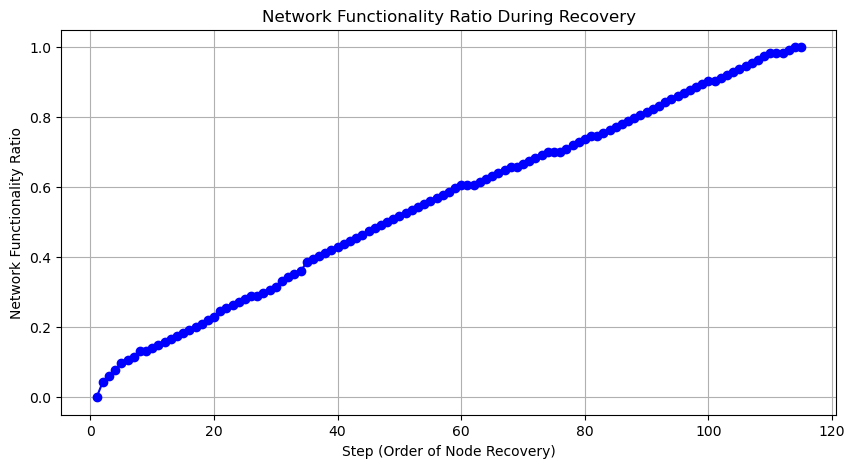

In [26]:
nodes_by_eigen=[]
def simulate_recovery_eigen(G, nodes_to_remove):
    H = nx.Graph()  
    seq_added_eigen=[]
    # Calculate the initial performance for the functionality ratio
    initial_performance = calculate_network_performance(G)
    
    recovery_performance = []
    recovery_performance=[calculate_network_performance(H)/initial_performance]
    # Try obtaining eigenvector centrality with more iterations and a higher tolerance
    try:
        centrality = nx.eigenvector_centrality(G, max_iter=5000, tol=1e-06)
    except nx.PowerIterationFailedConvergence:
        print("Eigenvector centrality failed to converge, trying with a random start vector.")
        nstart = {n: 1 for n in G.nodes()}  # Start with equal centrality assumption
        centrality = nx.eigenvector_centrality(G, max_iter=500, tol=1e-06, nstart=nstart)
    
    nodes_sorted_by_centrality = sorted(nodes_to_remove, key=lambda n: centrality[n], reverse=True)
    
    for index, node in enumerate(nodes_sorted_by_centrality):
        H.add_node(node, **G.nodes[node])
        H.add_edges_from(list(G.edges(node)))
        seq_added_eigen.append(node)
        
        current_performance = calculate_network_performance(H)
        functionality_ratio = current_performance / initial_performance
        recovery_performance.append(functionality_ratio)
        #print(f'Functionality after recovering node {index + 1}: {functionality_ratio}')
    
    return recovery_performance, seq_added_eigen




## Closeness based recovery

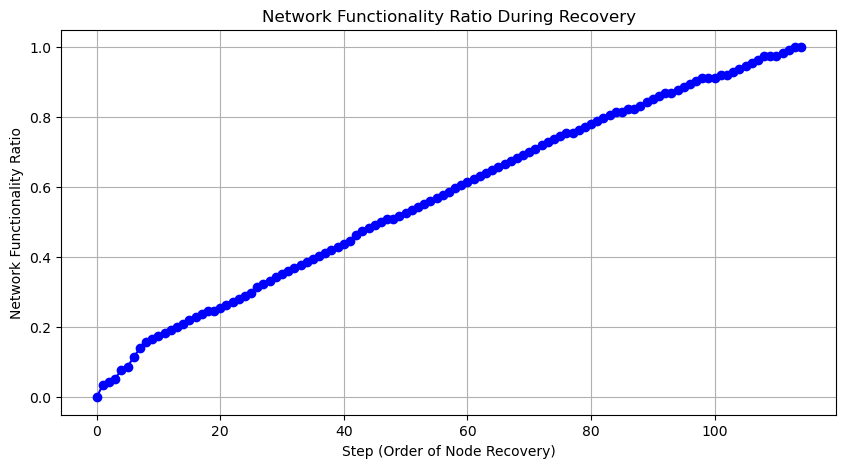

Time taken for recovery process: 0.007765293121337891 seconds


In [28]:
import networkx as nx
import matplotlib.pyplot as plt
import copy
import time

def simulate_recovery_closeness(G, nodes_to_remove):
    H = nx.Graph()
    seq_added_closeness=[]
    # Calculate the initial performance for the functionality ratio
    initial_performance = calculate_network_performance(G)
    
    recovery_performance = [calculate_network_performance(H) / initial_performance]
    
    # Calculate closeness centrality for the nodes
    centrality = nx.closeness_centrality(G)
    
    # Sort removed nodes by their centrality in descending order
    nodes_sorted_by_centrality = sorted(nodes_to_remove, key=lambda n: centrality.get(n, 0), reverse=True)
    
    for index, node in enumerate(nodes_sorted_by_centrality):
        H.add_node(node, **G.nodes[node])
        H.add_edges_from(list(G.edges(node)))
        seq_added_closeness.append(node)
        
        # Calculate current performance and functionality ratio
        current_performance = calculate_network_performance(H)
        functionality_ratio = current_performance / initial_performance
        recovery_performance.append(functionality_ratio)
        #print(f'Functionality after recovering node {index + 1}: {functionality_ratio}')
    
    return recovery_performance, seq_added_closeness



## Domirank Centrality based recovery

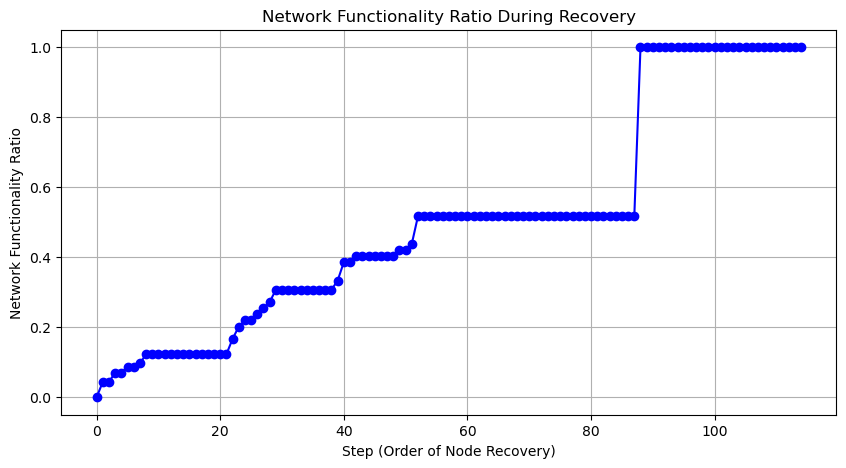

Time taken for DomiRank-based recovery: 0.17358016967773438 seconds


In [32]:
import copy
import numpy as np
import networkx as nx
import time

def domirank(G, sigma=-1, dt=0.1, epsilon=1e-5, maxIter=1000, checkStep=10):
    if isinstance(G, nx.Graph):  # Check if it is a NetworkX graph
        G = nx.to_scipy_sparse_array(G)  # Convert to scipy sparse array if it is a graph
    else:
        G = G.copy()
    if sigma == -1:
        sigma = optimal_sigma(G, dt=dt, epsilon=epsilon, maxIter=maxIter, checkStep=checkStep)
    pGAdj = sigma * G.astype(np.float32)
    Psi = np.zeros(pGAdj.shape[0]).astype(np.float32)
    maxVals = np.zeros(int(maxIter / checkStep)).astype(np.float32)
    dt = np.float32(dt)
    j = 0
    boundary = epsilon * pGAdj.shape[0] * dt
    for i in range(maxIter):
        tempVal = ((pGAdj @ (1 - Psi)) - Psi) * dt
        Psi += tempVal.real
        if i % checkStep == 0:
            if np.abs(tempVal).sum() < boundary:
                break
            maxVals[j] = tempVal.max()
            if i == 0:
                initialChange = maxVals[j]
            if j > 0:
                if maxVals[j] > maxVals[j - 1] and maxVals[j - 1] > maxVals[j - 2]:
                    return False, Psi
            j += 1

    return True, Psi

def find_eigenvalue(G, minVal=0, maxVal=1, maxDepth=100, dt=0.1, epsilon=1e-5, maxIter=100, checkStep=10):
    x = (minVal + maxVal) / G.sum(axis=-1).max()
    minValStored = 0
    for i in range(maxDepth):
        if maxVal - minVal < epsilon:
            break
        if domirank(G, x, dt, epsilon, maxIter, checkStep)[0]:
            minVal = x
            x = (minVal + maxVal) / 2
            minValStored = minVal
        else:
            maxVal = (x + maxVal) / 2
            x = (minVal + maxVal) / 2
        if minVal == 0:
            print(f'Current Interval : [-inf, -{1 / maxVal}]')
        else:
            print(f'Current Interval : [-{1 / minVal}, -{1 / maxVal}]')
    finalVal = (maxVal + minVal) / 2
    return -1 / finalVal

def process_iteration(q, i, sigma, spArray, maxIter, checkStep, dt, epsilon, sampling):
    tf, domiDist = domirank(spArray, sigma, dt=dt, epsilon=epsilon, maxIter=maxIter, checkStep=checkStep)
    domiAttack = generate_attack(domiDist)
    ourTempAttack, __ = network_attack_sampled(spArray, domiAttack, sampling=sampling)
    finalErrors = ourTempAttack.sum()
    q.put(finalErrors)

def optimal_sigma(spArray, endVal=0, startval=0.000001, iterationNo=100, dt=0.1, epsilon=1e-5, maxIter=100, checkStep=10, maxDepth=100, sampling=0):
    if endVal == 0:
        endVal = find_eigenvalue(spArray, maxDepth=maxDepth, dt=dt, epsilon=epsilon, maxIter=maxIter, checkStep=checkStep)
    import multiprocessing as mp
    endval = -0.9999 / endVal
    tempRange = np.arange(startval, endval + (endval - startval) / iterationNo, (endval - startval) / iterationNo)
    processes = []
    q = mp.Queue()
    for i, sigma in enumerate(tempRange):
        p = mp.Process(target=process_iteration, args=(q, i, sigma, spArray, maxIter, checkStep, dt, epsilon, sampling))
        p.start()
        processes.append(p)

    results = []
    for p in processes:
        p.join()
        result = q.get()
        results.append(result)
    finalErrors = np.array(results)
    minEig = np.where(finalErrors == finalErrors.min())[0][-1]
    minEig = tempRange[minEig]
    return minEig, finalErrors

optimal_sigma_value = 0.26


def simulate_recovery_domirank(G, nodes_to_remove):
    H = nx.Graph()
    seq_added_domirank = []
    # Calculate the initial performance for the functionality ratio
    initial_performance = calculate_network_performance(G)
    
    recovery_performance = [calculate_network_performance(H) / initial_performance]
    
    # Calculate DomiRank centrality for the nodes
    converged, domirank_centrality = domirank(nx.to_scipy_sparse_array(G), sigma=optimal_sigma_value)
    if not converged:
        print("Warning: DomiRank calculation did not converge. Results may be inaccurate.")
    
    # Mapping nodes to their DomiRank centrality values
    domirank_dict = {node: domirank_centrality[i] for i, node in enumerate(G.nodes)}
    
    # Sort removed nodes by their centrality in descending order
    nodes_sorted_by_domirank = sorted(nodes_to_remove, key=lambda n: domirank_dict.get(n, 0), reverse=True)
    
    for index, node in enumerate(nodes_sorted_by_domirank):
        H.add_node(node, **G.nodes[node])
        H.add_edges_from(list(G.edges(node)))
        seq_added_domirank.append(node)
        
        # Calculate current performance and functionality ratio
        current_performance = calculate_network_performance(H)
        functionality_ratio = current_performance / initial_performance
        recovery_performance.append(functionality_ratio)
        # print(f'Functionality after recovering node {index + 1}: {functionality_ratio}')
    
    return recovery_performance, seq_added_domirank



In [33]:
# import networkx as nx
# import numpy as np
# import matplotlib.pyplot as plt
# import copy

# def simulate_recovery_dynamic_betweenness(G, nodes_to_remove):
#     H = copy.deepcopy(G)
#     H.remove_nodes_from(nodes_to_remove)
#     seq_added_dynamic_betweenness = []
#     initial_performance = calculate_network_performance(G)
#     recovery_performance = [calculate_network_performance(H) / initial_performance]

#     # Initialize the subgraph S with the remaining nodes in H
#     S = set(H.nodes())
#     H_all = set(nodes_to_remove)
#     index=0
#     while H_all:
#         # Identify potential nodes to add from H_all to S
#         potential_add_nodes = list(H_all)
#         betweenness_scores = {}

#         for node in potential_add_nodes:
#             # Calculate the betweenness centrality if the node were added to S
#             test_graph = H.copy()
#             test_graph.add_node(node)
#             for neighbor in G.neighbors(node):
#                 if neighbor in test_graph:
#                     test_graph.add_edge(node, neighbor)
#             betweenness_scores[node] = nx.betweenness_centrality(test_graph)[node]

#         # Add the node with the highest betweenness centrality to S
#         best_node = max(betweenness_scores, key=betweenness_scores.get)
#         H.add_node(best_node)
#         seq_added_dynamic_betweenness.append(best_node)
#         for neighbor in G.neighbors(best_node):
#             if neighbor in H:
#                 H.add_edge(best_node, neighbor)
        
#         # Update the recovery performance
#         current_performance = calculate_network_performance(H)
#         functionality_ratio = current_performance / initial_performance
#         recovery_performance.append(functionality_ratio)
#         print(f'Functionality after recovering node {index + 1}: {functionality_ratio}')
#         index=index+1
#         # Remove the best node from H_all
#         H_all.remove(best_node)

#     return recovery_performance, seq_added_dynamic_betweenness

# # Example usage
# start_time = time.time()
# recovery_performance_dynamic_betweenness, seq_added_dynamic_betweenness = simulate_recovery_dynamic_betweenness(agg_G, nodes_to_remove)
# end_time = time.time()
# time_taken_dynamic_betweenness = end_time - start_time

# plot_functionality_ratio(recovery_performance_dynamic_betweenness)
# print(f'Time taken for Dynamic Betweenness Recovery: {time_taken_dynamic_betweenness} seconds')


In [97]:
# def simulate_recovery_dynamic_closeness(G, nodes_to_remove):
#     H = copy.deepcopy(G)
#     H.remove_nodes_from(nodes_to_remove)
#     seq_added_dynamic_closeness = []
#     initial_performance = calculate_network_performance(G)
#     recovery_performance = [calculate_network_performance(H) / initial_performance]

#     H_all = set(nodes_to_remove)
#     index = 0

#     while H_all:
#         potential_add_nodes = list(H_all)
#         closeness_scores = {}

#         for node in potential_add_nodes:
#             test_graph = H.copy()
#             test_graph.add_node(node)
#             for neighbor in G.neighbors(node):
#                 if neighbor in test_graph:
#                     test_graph.add_edge(node, neighbor)
#             closeness_scores[node] = nx.closeness_centrality(test_graph)[node]

#         # Add the node with the highest closeness centrality to the graph
#         best_node = max(closeness_scores, key=closeness_scores.get)
#         H.add_node(best_node)
#         seq_added_dynamic_closeness.append(best_node)
#         for neighbor in G.neighbors(best_node):
#             if neighbor in H:
#                 H.add_edge(best_node, neighbor)

#         current_performance = calculate_network_performance(H)
#         functionality_ratio = current_performance / initial_performance
#         recovery_performance.append(functionality_ratio)
#         print(f'Functionality after recovering node {index + 1}: {functionality_ratio}')
#         index += 1

#         H_all.remove(best_node)

#     return recovery_performance, seq_added_dynamic_closeness

# # Example usage
# start_time = time.time()
# recovery_performance_dynamic_closeness, seq_added_dynamic_closeness = simulate_recovery_dynamic_closeness(agg_G, nodes_to_remove)
# end_time = time.time()
# time_taken_dynamic_closeness = end_time - start_time

# plot_functionality_ratio(recovery_performance_dynamic_closeness)
# print(f'Time taken for Dynamic Closeness Recovery: {time_taken_dynamic_closeness} seconds')


In [98]:
# def simulate_recovery_dynamic_eigenvector(G, nodes_to_remove):
#     H = copy.deepcopy(G)
#     H.remove_nodes_from(nodes_to_remove)
#     seq_added_dynamic_eigenvector = []
#     initial_performance = calculate_network_performance(G)
#     recovery_performance = [calculate_network_performance(H) / initial_performance]

#     H_all = set(nodes_to_remove)
#     index = 0

#     while H_all:
#         potential_add_nodes = list(H_all)
#         eigenvector_scores = {}

#         for node in potential_add_nodes:
#             test_graph = H.copy()
#             test_graph.add_node(node)
#             for neighbor in G.neighbors(node):
#                 if neighbor in test_graph:
#                     test_graph.add_edge(node, neighbor)
#             eigenvector_scores[node] = nx.eigenvector_centrality(test_graph, max_iter=5000, tol=1e-06)[node]

#         # Add the node with the highest eigenvector centrality to the graph
#         best_node = max(eigenvector_scores, key=eigenvector_scores.get)
#         H.add_node(best_node)
#         seq_added_dynamic_eigenvector.append(best_node)
#         for neighbor in G.neighbors(best_node):
#             if neighbor in H:
#                 H.add_edge(best_node, neighbor)

#         current_performance = calculate_network_performance(H)
#         functionality_ratio = current_performance / initial_performance
#         recovery_performance.append(functionality_ratio)
#         print(f'Functionality after recovering node {index + 1}: {functionality_ratio}')
#         index += 1

#         H_all.remove(best_node)

#     return recovery_performance, seq_added_dynamic_eigenvector

# # Example usage
# start_time = time.time()
# recovery_performance_dynamic_eigenvector, seq_added_dynamic_eigenvector = simulate_recovery_dynamic_eigenvector(agg_G, nodes_to_remove)
# end_time = time.time()
# time_taken_dynamic_eigenvector = end_time - start_time

# plot_functionality_ratio(recovery_performance_dynamic_eigenvector)
# print(f'Time taken for Dynamic Eigenvector Recovery: {time_taken_dynamic_eigenvector} seconds')


In [119]:
import pickle
import pandas as pd
import matplotlib.pyplot as plt

# Load the existing Recovery_results.pkl file
with open('recovery_results.pkl', 'rb') as f:
    results = pickle.load(f)

# Extract attributes into a DataFrame
network_data = []
for city, attributes in results.items():
    network_data.append({
        "Name": city,
        "Nodes": attributes["Nodes"],
        "Number_of_Loops": attributes.get("Number_of_Loops", 0),
        "Normalized_Number_of_Loops": attributes.get("Normalized_Number_of_Loops", 0),
        "Domirank_AUC": attributes["Recovery_AUC"].get("Domirank", None)
    })

network_df = pd.DataFrame(network_data)

# Display sorted by Number_of_Loops
sorted_by_loops = network_df.sort_values(by="Number_of_Loops", ascending=False)
print("Sorted by Number of Loops:")
print(sorted_by_loops[["Name", "Number_of_Loops", "Normalized_Number_of_Loops", "Domirank_AUC"]])

# Display sorted by Normalized_Number_of_Loops
sorted_by_normalized_loops = network_df.sort_values(by="Normalized_Number_of_Loops", ascending=False)
print("\nSorted by Normalized Number of Loops:")
print(sorted_by_normalized_loops[["Name", "Nodes", "Normalized_Number_of_Loops", "Domirank_AUC"]])


Sorted by Number of Loops:
             Name  Number_of_Loops  Normalized_Number_of_Loops  Domirank_AUC
33         London               62                    0.168022      0.750000
31          Paris               57                    0.188742      0.800000
32       Shanghai               53                    0.153623      0.750000
34       New York               48                    0.103672      0.700000
30          Tokyo               46                    0.206278      0.790000
29          Delhi               12                    0.058537      0.720000
21    BuenosAires                8                    0.102564      0.769231
6          Vienna                7                    0.071429      0.747990
28        Chicago                7                    0.048951      0.720000
7    Philadelphia                6                    0.120000      0.726275
22       Valencia                4                    0.042105      0.601809
15         Lisbon                3               

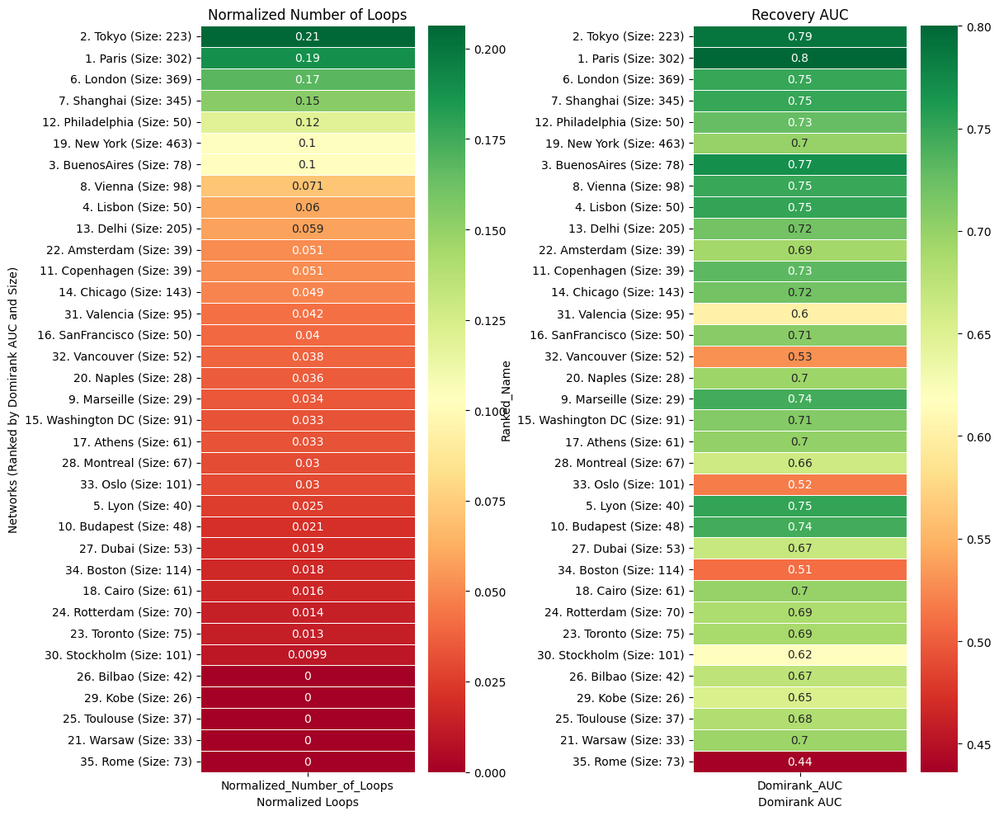

In [18]:
import pickle
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the existing Recovery_results.pkl file
with open('recovery_results.pkl', 'rb') as f:
    results = pickle.load(f)

# Extract attributes into a DataFrame
network_data = []
for city, attributes in results.items():
    network_data.append({
        "Name": city,
        "Nodes": attributes["Nodes"],
        "Number_of_Loops": attributes.get("Number_of_Loops", 0),
        "Normalized_Number_of_Loops": attributes.get("Normalized_Number_of_Loops", 0),
        "Domirank_AUC": attributes["Recovery_AUC"].get("Domirank", None)
    })

network_df = pd.DataFrame(network_data)

# Sort by Domirank_AUC in descending order to determine the rank
network_df = network_df.sort_values(by="Domirank_AUC", ascending=False).reset_index(drop=True)

# Add rank to the network names along with the size based on Domirank_AUC
network_df['Ranked_Name'] = network_df.apply(lambda x: f"{x.name + 1}. {x['Name']} (Size: {x['Nodes']})", axis=1)

# Sort by Normalized_Number_of_Loops for the heatmap
sorted_df = network_df.sort_values(by="Normalized_Number_of_Loops", ascending=False)
sorted_df.set_index("Ranked_Name", inplace=True)  # Set ranked names as index

# Create a new DataFrame for heatmaps with columns for both Normalized_Number_of_Loops and Domirank_AUC
heatmap_df = sorted_df[['Normalized_Number_of_Loops', 'Domirank_AUC']]

# Plot the dual heatmap
plt.figure(figsize=(12, 10))

# Heatmap for Normalized_Number_of_Loops
plt.subplot(1, 2, 1)
sns.heatmap(
    heatmap_df[['Normalized_Number_of_Loops']], 
    annot=True, 
    cmap="RdYlGn", 
    cbar=True, 
    linewidths=0.5,
    vmin=heatmap_df['Normalized_Number_of_Loops'].min(), 
    vmax=heatmap_df['Normalized_Number_of_Loops'].max()
)
plt.title("Normalized Number of Loops")
plt.xlabel("Normalized Loops")
plt.ylabel("Networks (Ranked by Domirank AUC and Size)")

# Heatmap for Domirank_AUC
plt.subplot(1, 2, 2)
sns.heatmap(
    heatmap_df[['Domirank_AUC']], 
    annot=True, 
    cmap="RdYlGn", 
    cbar=True, 
    linewidths=0.5,
    vmin=heatmap_df['Domirank_AUC'].min(), 
    vmax=heatmap_df['Domirank_AUC'].max()
)
plt.title("Recovery AUC")
plt.xlabel("Domirank AUC")

plt.tight_layout()
plt.show()


In [69]:
import pickle
# Load the combined results from the pickle file
with open('recovery_results.pkl', 'rb') as f:
    network_results = pickle.load(f)

In [70]:
type(network_results)

dict

In [89]:
import pickle
import pandas as pd
from scipy.stats import kendalltau

# Load the combined results from the pickle file
with open('recovery_results.pkl', 'rb') as f:
    network_results = pickle.load(f)

# Initialize data storage for network attributes and recovery AUCs
attributes_list = []
recovery_methods = ["Random", "Closeness", "Betweenness", "Eigen", "Degree", "Domirank"]

# Extract attributes and Recovery_AUC values for each network
for city, data in network_results.items():
    attributes = {
        "Nodes": data.get("Nodes"),
        "Avg_Degree": data.get("Avg_Degree"),
        "Avg_SPL": data.get("Avg_SPL"),
        "Density": data.get("Density"),
        "Diameter": data.get("Diameter"),
        "Modularity_Index": data.get("Modularity_Index"),
        "Clustering_Coefficient": data.get("Clustering_Coefficient"),
    }
    # Add Recovery AUC for each method
    for method in recovery_methods:
        attributes[method] = data["Recovery_AUC"].get(method)
    
    attributes_list.append(attributes)

# Convert to DataFrame
df = pd.DataFrame(attributes_list)

# Compute Kendall Tau correlation for each attribute and recovery method
correlation_matrix = pd.DataFrame(index=df.columns[:-len(recovery_methods)], columns=recovery_methods)

for attr in df.columns[:-len(recovery_methods)]:
    for method in recovery_methods:
        tau, _ = kendalltau(df[attr], df[method])
        correlation_matrix.loc[attr, method] = tau

# Convert to float and display the result
correlation_matrix = correlation_matrix.astype(float)

# Print the correlation matrix
print("Kendall Tau Correlation Table:")
print(correlation_matrix)


Kendall Tau Correlation Table:
                          Random  Closeness  Betweenness     Eigen    Degree  \
Nodes                  -0.096447  -0.354238     0.108383 -0.254885  0.033813   
Avg_Degree              0.238807  -0.001746     0.397766  0.014004  0.362263   
Avg_SPL                -0.321549  -0.659363    -0.192081 -0.554532 -0.262405   
Density                 0.107835   0.361183    -0.099494  0.258887 -0.028620   
Diameter               -0.288416  -0.653026    -0.153724 -0.562142 -0.225082   
Modularity_Index       -0.033755  -0.253593     0.089527 -0.174577  0.069140   
Clustering_Coefficient -0.004305  -0.172483     0.114173 -0.205345  0.066668   

                        Domirank  
Nodes                   0.079527  
Avg_Degree              0.444494  
Avg_SPL                -0.183502  
Density                -0.070767  
Diameter               -0.141648  
Modularity_Index        0.013502  
Clustering_Coefficient  0.021524  


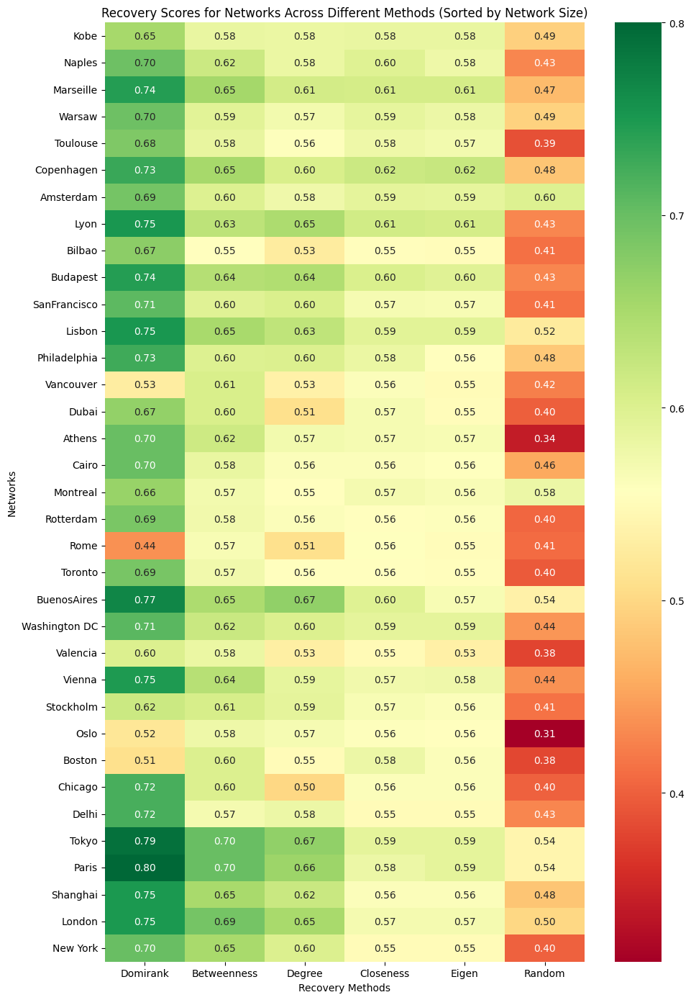

In [20]:
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Load the results from the 'recovery_results.pkl' file (with recovery scores)
with open('recovery_results.pkl', 'rb') as f:
    results = pickle.load(f)

# Extract network attributes and recovery AUC scores from results
network_attr_df = pd.DataFrame({city: res for city, res in results.items()}).T
recovery_methods = ["Domirank", "Betweenness", "Degree", "Closeness", "Eigen", "Random"]

# Extract recovery AUC data for the heatmap
recovery_auc_df = pd.DataFrame({city: res['Recovery_AUC'] for city, res in results.items()}).T

# Sort the networks based on the number of nodes (ascending order)
sorted_networks = network_attr_df.sort_values(by="Nodes").index
recovery_auc_df_sorted = recovery_auc_df.loc[sorted_networks]

# Generate the heatmap for recovery scores across urban networks in ascending network size order
plt.figure(figsize=(10, 14))
sns.heatmap(recovery_auc_df_sorted, annot=True, cmap='RdYlGn', cbar=True, fmt=".2f")
plt.title("Recovery Scores for Networks Across Different Methods (Sorted by Network Size)")
plt.ylabel("Networks")
plt.xlabel("Recovery Methods")
plt.tight_layout()

# Save and show the heatmap
plt.savefig("recovery_heatmap_sorted.png")
plt.show()


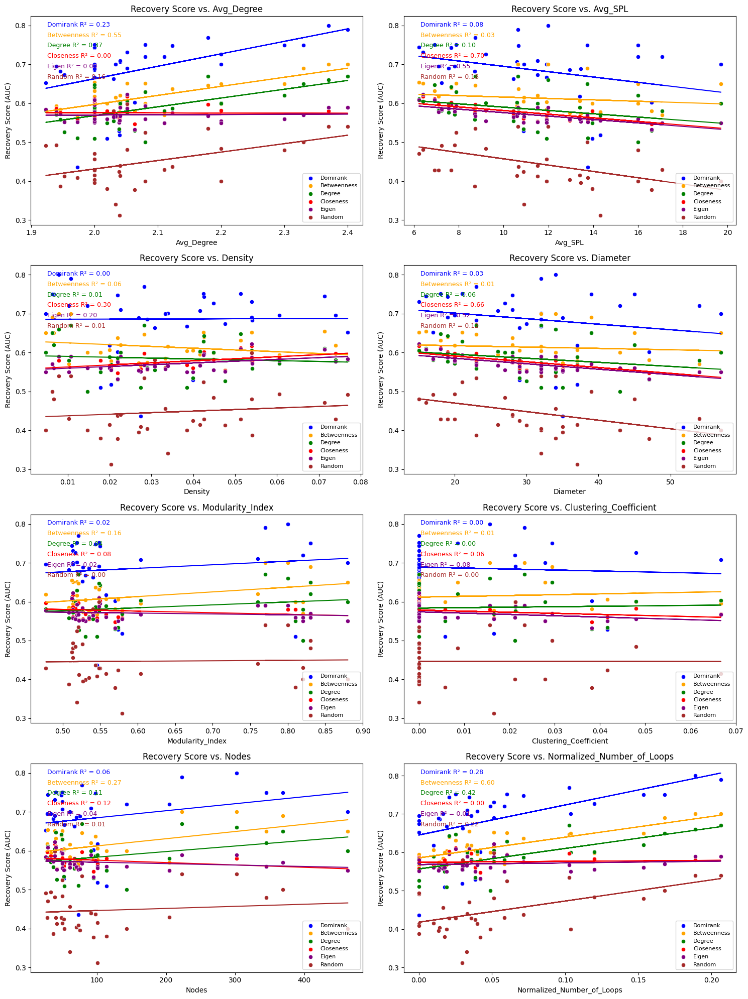

R^2 Values for Each Metric and Recovery Method:

Metric: Avg_Degree
  Domirank: R² = 0.23
  Betweenness: R² = 0.55
  Degree: R² = 0.37
  Closeness: R² = 0.00
  Eigen: R² = 0.00
  Random: R² = 0.16

Metric: Avg_SPL
  Domirank: R² = 0.08
  Betweenness: R² = 0.03
  Degree: R² = 0.10
  Closeness: R² = 0.70
  Eigen: R² = 0.55
  Random: R² = 0.18

Metric: Density
  Domirank: R² = 0.00
  Betweenness: R² = 0.06
  Degree: R² = 0.01
  Closeness: R² = 0.30
  Eigen: R² = 0.20
  Random: R² = 0.01

Metric: Diameter
  Domirank: R² = 0.03
  Betweenness: R² = 0.01
  Degree: R² = 0.06
  Closeness: R² = 0.66
  Eigen: R² = 0.52
  Random: R² = 0.12

Metric: Modularity_Index
  Domirank: R² = 0.02
  Betweenness: R² = 0.16
  Degree: R² = 0.04
  Closeness: R² = 0.08
  Eigen: R² = 0.02
  Random: R² = 0.00

Metric: Clustering_Coefficient
  Domirank: R² = 0.00
  Betweenness: R² = 0.01
  Degree: R² = 0.00
  Closeness: R² = 0.06
  Eigen: R² = 0.08
  Random: R² = 0.00

Metric: Nodes
  Domirank: R² = 0.06
  Betweenne

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.linear_model import LinearRegression
import pickle
import pandas as pd

# Load the results from the recovery_results.pkl file
with open('recovery_results.pkl', 'rb') as f:
    recovery_results = pickle.load(f)

# Extract network attributes and recovery AUC scores from the results
network_attr_df = pd.DataFrame(
    {city: {**metrics, **metrics["Recovery_AUC"]} for city, metrics in recovery_results.items()}
).T

# Separate network attributes and recovery methods into different DataFrames
topological_metrics = ['Avg_Degree', 'Avg_SPL', 'Density', 'Diameter', 'Modularity_Index', 'Clustering_Coefficient', 'Nodes', 'Normalized_Number_of_Loops']
recovery_methods = ['Domirank', 'Betweenness', 'Degree', 'Closeness', 'Eigen', 'Random']

# Prepare the DataFrames
auc_df = network_attr_df[recovery_methods]
network_attr_df = network_attr_df[topological_metrics]

# Function to create scatter plot with linear fit
def plot_with_trendline(x, y, label, color, ax):
    sns.scatterplot(x=x, y=y, ax=ax, label=label, color=color)
    # Fit a linear regression line
    model = LinearRegression()
    x_array = np.array(x).reshape(-1, 1)
    model.fit(x_array, y)
    trendline = model.predict(x_array)
    ax.plot(x, trendline, color=color)
    return model.score(x_array, y)  # Return R^2 value

# Determine the number of subplots needed
n_metrics = len(topological_metrics)  # Number of metrics
n_cols = 2
n_rows = (n_metrics + n_cols - 1) // n_cols  # Ceiling division to get enough rows

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5))
axes = axes.flatten()

colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown']

# Collect R^2 values
r2_results = {}

for i, metric in enumerate(topological_metrics):
    ax = axes[i]
    r2_results[metric] = {}
    
    for j, method in enumerate(recovery_methods):
        x = network_attr_df[metric]  # Topological metric
        y = auc_df[method]  # Recovery method performance (AUC)
        r2 = plot_with_trendline(x, y, method, colors[j], ax)  # Plot data and trendline
        r2_results[metric][method] = r2
        
        # Display R² value in plot
        ax.text(0.05, 0.95 - j * 0.05, f'{method} R² = {r2:.2f}', transform=ax.transAxes, color=colors[j], fontsize=9)

    ax.set_title(f'Recovery Score vs. {metric}')
    ax.set_xlabel(metric)
    ax.set_ylabel('Recovery Score (AUC)')
    ax.legend(loc='lower right', fontsize=8)

# Remove any unused subplots
if len(axes) > n_metrics:
    for idx in range(n_metrics, len(axes)):
        fig.delaxes(axes[idx])

plt.tight_layout()
plt.savefig("fit_lines_recovery.png", bbox_inches='tight')
plt.show()

# Print the R^2 values
print("R^2 Values for Each Metric and Recovery Method:")
for metric, method_r2 in r2_results.items():
    print(f"\nMetric: {metric}")
    for method, r2 in method_r2.items():
        print(f"  {method}: R² = {r2:.2f}")


C:\Users\orije\AppData\Local\Temp\ipykernel_41176\2417368436.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  plt.gca().set_yticklabels(['Random', 'Eigenvector', 'Closeness', 'Degree', 'Betweenness', 'Domirank'])


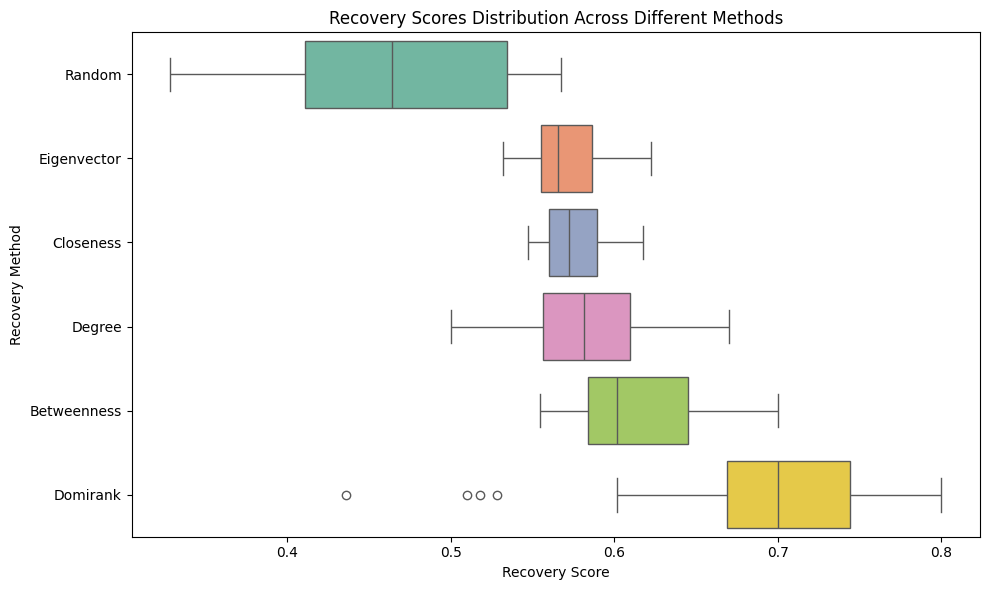

In [6]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import pickle

# Load the recovery results data from the pickle file
with open('recovery_results.pkl', 'rb') as file:
    recovery_results = pickle.load(file)

# Extract the AUC data (recovery scores) from the results
recovery_auc_data = pd.DataFrame(
    {city: metrics["Recovery_AUC"] for city, metrics in recovery_results.items()}
).T

# Reorder the columns to match the required sequence: 
# 'Random', 'Eigen', 'Closeness', 'Degree', 'Betweenness', 'Domirank'
reordered_recovery_auc_data = recovery_auc_data[['Random', 'Eigen', 'Closeness', 'Degree', 'Betweenness', 'Domirank']]

# Create a box plot for recovery scores across different recovery methods
plt.figure(figsize=(10, 6))
sns.boxplot(data=reordered_recovery_auc_data, orient='h', palette='Set2')

# Set correct order of labels from top to bottom
plt.gca().set_yticklabels(['Random', 'Eigenvector', 'Closeness', 'Degree', 'Betweenness', 'Domirank'])

# Add plot title and labels
plt.title('Recovery Scores Distribution Across Different Methods')
plt.xlabel('Recovery Score')
plt.ylabel('Recovery Method')

# Show the plot
plt.tight_layout()
plt.savefig("recovery_boxplot.png")
plt.show()


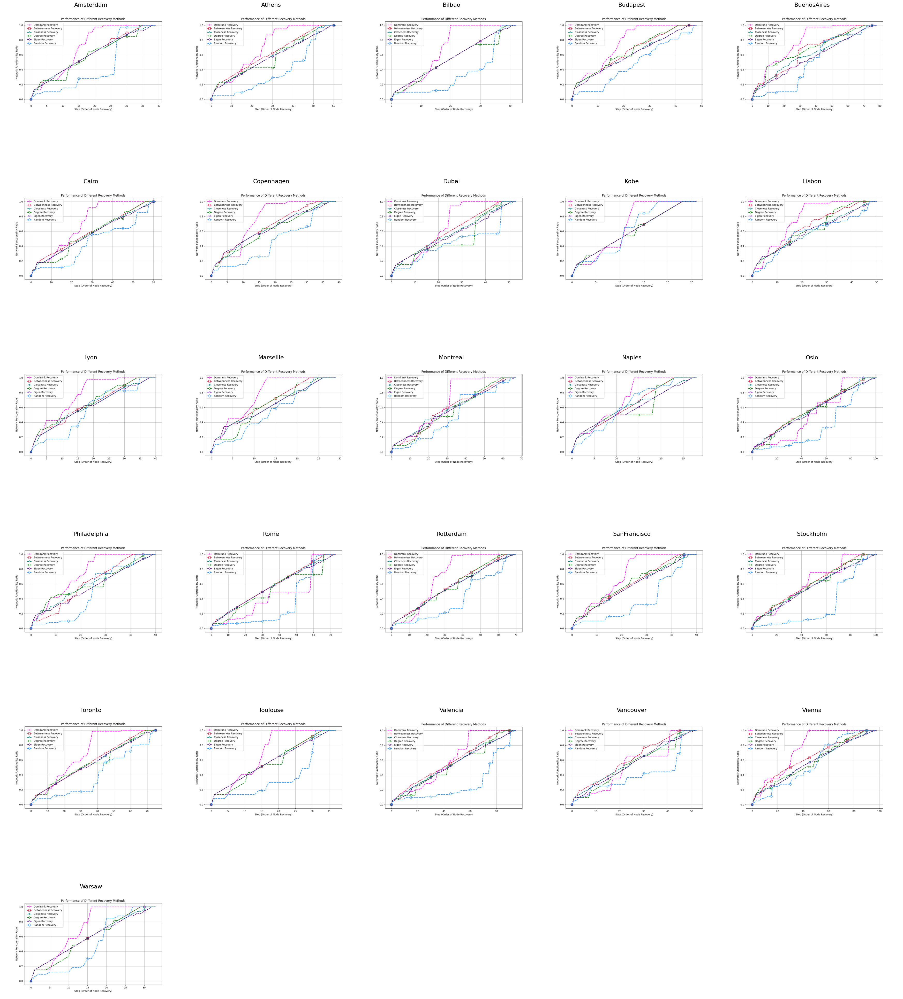

In [37]:
import matplotlib.pyplot as plt
import os
from PIL import Image

# Path to the directory where the recovery plots are stored
directory = "recovery_graphs"

# Get a list of all the image file names in the directory
image_files = [f for f in os.listdir(directory) if f.endswith('.png')]

# Sort the image files to ensure they are displayed in order (optional)
image_files.sort()

# Number of images (assuming they follow the format {city_name}_recovery_plot.png)
num_images = len(image_files)

# Define the grid size (e.g., 6 rows and 5 columns for 26 images)
n_rows = 6
n_cols = 5

# Create a figure to hold the subplots (increase figsize for larger plots)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(35, 42))  # Larger figsize for bigger plots

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each image file and add it to the corresponding subplot
for i, image_file in enumerate(image_files[:n_rows * n_cols]):  # Ensure not to exceed number of subplots
    # Load the image
    img_path = os.path.join(directory, image_file)
    img = Image.open(img_path)
    
    # Extract the city name from the filename (removing '_recovery_plot' and file extension)
    city_name = os.path.splitext(image_file.replace('_recovery_plot', ''))[0]
    
    # Display the image in the corresponding subplot
    axes[i].imshow(img)
    axes[i].axis('off')  # Turn off the axis for cleaner display
    axes[i].set_title(f"{city_name}", fontsize=16)  # Use the city name as the title

# Remove any unused subplots (if there are less than n_rows * n_cols images)
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout for better spacing and reduced padding
plt.tight_layout(pad=1.0)  # Reduce padding between plots by lowering the 'pad' value

# Save the figure as a PNG file
output_path = "combined_recovery_plots.png"
plt.savefig(output_path, bbox_inches='tight')  # Save the figure

# Show the plot
plt.show()



🧠 Recovery Strategy: Domirank
📉 RMSE: 0.0661
🧾 Regression Equation:
Domirank AUC = 0.6469 + (-0.1007 * Nodes) + (0.2286 * Normalized_Number_of_Loops)


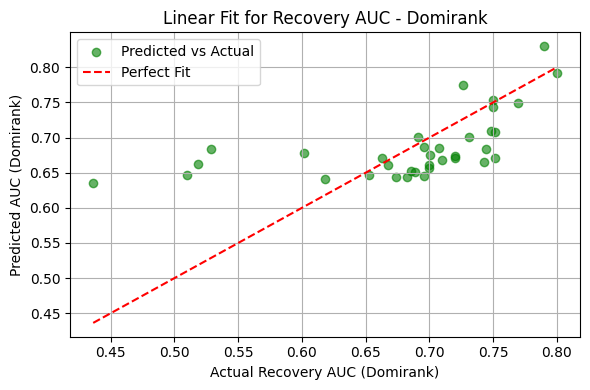


📊 Actual vs Predicted Recovery AUC for Domirank:
Athens: Actual = 0.7008, Predicted = 0.6752
Budapest: Actual = 0.7432, Predicted = 0.6649
Cairo: Actual = 0.7000, Predicted = 0.6570
Copenhagen: Actual = 0.7311, Predicted = 0.7007
Montreal: Actual = 0.6630, Predicted = 0.6705
SanFrancisco: Actual = 0.7075, Predicted = 0.6857
Vienna: Actual = 0.7480, Predicted = 0.7095
Philadelphia: Actual = 0.7263, Predicted = 0.7744
Kobe: Actual = 0.6524, Predicted = 0.6469
Naples: Actual = 0.6958, Predicted = 0.6860
Marseille: Actual = 0.7443, Predicted = 0.6844
Toulouse: Actual = 0.6824, Predicted = 0.6444
Lyon: Actual = 0.7512, Predicted = 0.6714
Amsterdam: Actual = 0.6907, Predicted = 0.7007
Bilbao: Actual = 0.6739, Predicted = 0.6432
Lisbon: Actual = 0.7514, Predicted = 0.7079
Dubai: Actual = 0.6675, Predicted = 0.6616
Vancouver: Actual = 0.5287, Predicted = 0.6835
Rotterdam: Actual = 0.6859, Predicted = 0.6526
Rome: Actual = 0.4362, Predicted = 0.6361
Toronto: Actual = 0.6890, Predicted = 0.6504

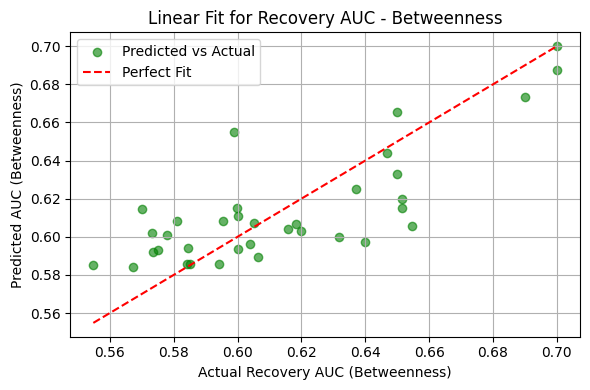


📊 Actual vs Predicted Recovery AUC for Betweenness:
Athens: Actual = 0.6159, Predicted = 0.6039
Budapest: Actual = 0.6399, Predicted = 0.5973
Cairo: Actual = 0.5845, Predicted = 0.5943
Copenhagen: Actual = 0.6516, Predicted = 0.6153
Montreal: Actual = 0.5732, Predicted = 0.6020
SanFrancisco: Actual = 0.5953, Predicted = 0.6084
Vienna: Actual = 0.6371, Predicted = 0.6253
Philadelphia: Actual = 0.5988, Predicted = 0.6551
Kobe: Actual = 0.5840, Predicted = 0.5858
Naples: Actual = 0.6182, Predicted = 0.6066
Marseille: Actual = 0.6546, Predicted = 0.6058
Toulouse: Actual = 0.5850, Predicted = 0.5855
Lyon: Actual = 0.6317, Predicted = 0.6000
Amsterdam: Actual = 0.5997, Predicted = 0.6153
Bilbao: Actual = 0.5548, Predicted = 0.5853
Lisbon: Actual = 0.6514, Predicted = 0.6201
Dubai: Actual = 0.6039, Predicted = 0.5960
Vancouver: Actual = 0.6052, Predicted = 0.6075
Rotterdam: Actual = 0.5751, Predicted = 0.5928
Rome: Actual = 0.5673, Predicted = 0.5844
Toronto: Actual = 0.5736, Predicted = 0.5

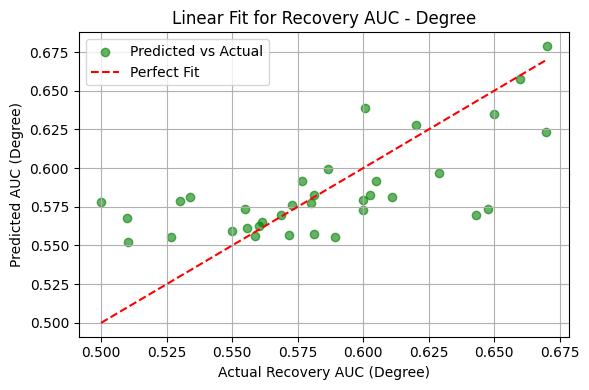


📊 Actual vs Predicted Recovery AUC for Degree:
Athens: Actual = 0.5728, Predicted = 0.5764
Budapest: Actual = 0.6429, Predicted = 0.5696
Cairo: Actual = 0.5612, Predicted = 0.5650
Copenhagen: Actual = 0.6048, Predicted = 0.5919
Montreal: Actual = 0.5550, Predicted = 0.5737
SanFrancisco: Actual = 0.6027, Predicted = 0.5827
Vienna: Actual = 0.5867, Predicted = 0.5991
Philadelphia: Actual = 0.6008, Predicted = 0.6386
Kobe: Actual = 0.5812, Predicted = 0.5576
Naples: Actual = 0.5813, Predicted = 0.5823
Marseille: Actual = 0.6109, Predicted = 0.5813
Toulouse: Actual = 0.5587, Predicted = 0.5563
Lyon: Actual = 0.6476, Predicted = 0.5734
Amsterdam: Actual = 0.5766, Predicted = 0.5919
Bilbao: Actual = 0.5266, Predicted = 0.5557
Lisbon: Actual = 0.6290, Predicted = 0.5967
Dubai: Actual = 0.5100, Predicted = 0.5676
Vancouver: Actual = 0.5341, Predicted = 0.5814
Rotterdam: Actual = 0.5602, Predicted = 0.5625
Rome: Actual = 0.5103, Predicted = 0.5521
Toronto: Actual = 0.5557, Predicted = 0.5612
B

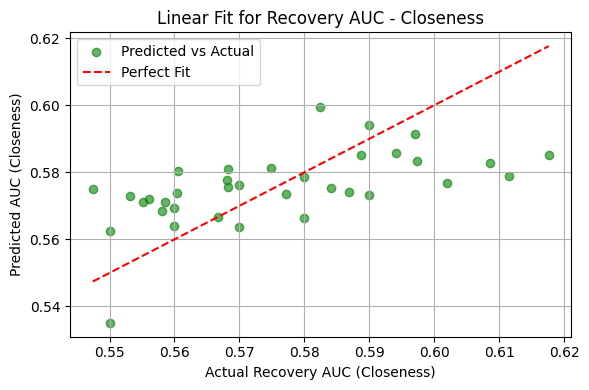


📊 Actual vs Predicted Recovery AUC for Closeness:
Athens: Actual = 0.5681, Predicted = 0.5777
Budapest: Actual = 0.6020, Predicted = 0.5769
Cairo: Actual = 0.5604, Predicted = 0.5739
Copenhagen: Actual = 0.6176, Predicted = 0.5853
Montreal: Actual = 0.5699, Predicted = 0.5762
SanFrancisco: Actual = 0.5682, Predicted = 0.5810
Vienna: Actual = 0.5749, Predicted = 0.5813
Philadelphia: Actual = 0.5824, Predicted = 0.5996
Kobe: Actual = 0.5840, Predicted = 0.5753
Naples: Actual = 0.5973, Predicted = 0.5833
Marseille: Actual = 0.6086, Predicted = 0.5828
Toulouse: Actual = 0.5772, Predicted = 0.5737
Lyon: Actual = 0.6116, Predicted = 0.5790
Amsterdam: Actual = 0.5888, Predicted = 0.5853
Bilbao: Actual = 0.5532, Predicted = 0.5729
Lisbon: Actual = 0.5941, Predicted = 0.5857
Dubai: Actual = 0.5683, Predicted = 0.5757
Vancouver: Actual = 0.5606, Predicted = 0.5804
Rotterdam: Actual = 0.5561, Predicted = 0.5721
Rome: Actual = 0.5580, Predicted = 0.5684
Toronto: Actual = 0.5552, Predicted = 0.571

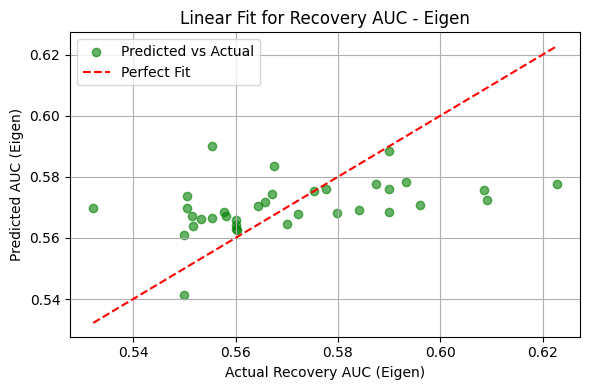


📊 Actual vs Predicted Recovery AUC for Eigen:
Athens: Actual = 0.5657, Predicted = 0.5717
Budapest: Actual = 0.5961, Predicted = 0.5707
Cairo: Actual = 0.5578, Predicted = 0.5684
Copenhagen: Actual = 0.6228, Predicted = 0.5778
Montreal: Actual = 0.5644, Predicted = 0.5704
SanFrancisco: Actual = 0.5671, Predicted = 0.5743
Vienna: Actual = 0.5753, Predicted = 0.5753
Philadelphia: Actual = 0.5553, Predicted = 0.5902
Kobe: Actual = 0.5840, Predicted = 0.5690
Naples: Actual = 0.5776, Predicted = 0.5759
Marseille: Actual = 0.6086, Predicted = 0.5756
Toulouse: Actual = 0.5722, Predicted = 0.5678
Lyon: Actual = 0.6091, Predicted = 0.5725
Amsterdam: Actual = 0.5875, Predicted = 0.5778
Bilbao: Actual = 0.5515, Predicted = 0.5673
Lisbon: Actual = 0.5933, Predicted = 0.5783
Dubai: Actual = 0.5505, Predicted = 0.5698
Vancouver: Actual = 0.5504, Predicted = 0.5738
Rotterdam: Actual = 0.5581, Predicted = 0.5670
Rome: Actual = 0.5517, Predicted = 0.5638
Toronto: Actual = 0.5532, Predicted = 0.5663
Bu

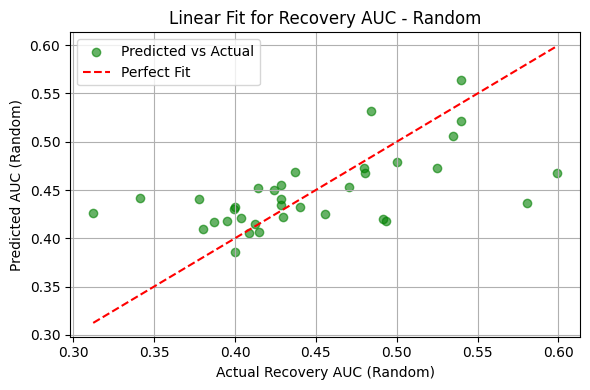


📊 Actual vs Predicted Recovery AUC for Random:
Athens: Actual = 0.3410, Predicted = 0.4418
Budapest: Actual = 0.4286, Predicted = 0.4340
Cairo: Actual = 0.4560, Predicted = 0.4255
Copenhagen: Actual = 0.4804, Predicted = 0.4672
Montreal: Actual = 0.5809, Predicted = 0.4370
SanFrancisco: Actual = 0.4145, Predicted = 0.4525
Vienna: Actual = 0.4371, Predicted = 0.4687
Philadelphia: Actual = 0.4839, Predicted = 0.5323
Kobe: Actual = 0.4915, Predicted = 0.4202
Naples: Actual = 0.4286, Predicted = 0.4552
Marseille: Actual = 0.4707, Predicted = 0.4536
Toulouse: Actual = 0.3873, Predicted = 0.4167
Lyon: Actual = 0.4287, Predicted = 0.4407
Amsterdam: Actual = 0.5990, Predicted = 0.4672
Bilbao: Actual = 0.4125, Predicted = 0.4151
Lisbon: Actual = 0.5247, Predicted = 0.4724
Dubai: Actual = 0.3995, Predicted = 0.4305
Vancouver: Actual = 0.4242, Predicted = 0.4503
Rotterdam: Actual = 0.4038, Predicted = 0.4205
Rome: Actual = 0.4086, Predicted = 0.4053
Toronto: Actual = 0.3954, Predicted = 0.4180
B

In [1]:
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

# Load the results from the pickle file
with open('recovery_results.pkl', 'rb') as f:
    results = pickle.load(f)

# Define recovery strategies to test
strategies = ["Domirank", "Betweenness", "Degree", "Closeness", "Eigen", "Random"]

# Prepare data
network_attributes = []
recovery_aucs = []
city_names = []

for city, data in results.items():
    attributes = {
        "Nodes": data["Nodes"],
        # "Avg_Degree": data["Avg_Degree"],
        # "Avg_SPL": data["Avg_SPL"],
        # "Density": data["Density"],
        # "Diameter": data["Diameter"],
        # "Modularity_Index": data["Modularity_Index"],
        # "Clustering_Coefficient": data["Clustering_Coefficient"],
        "Normalized_Number_of_Loops": data["Normalized_Number_of_Loops"]
    }
    network_attributes.append(attributes)
    recovery_aucs.append(data["Recovery_AUC"])
    city_names.append(city)

# Convert to DataFrames
attr_df = pd.DataFrame(network_attributes)
auc_df = pd.DataFrame(recovery_aucs)
scaler = MinMaxScaler()
X = pd.DataFrame(scaler.fit_transform(attr_df), columns=attr_df.columns)

# Loop through each strategy
for strategy in strategies:
    if strategy not in auc_df.columns:
        print(f"⚠️ Skipping '{strategy}' — not found in AUC data.")
        continue

    y = auc_df[strategy]

    # Fit regression model
    model = LinearRegression()
    model.fit(X, y)
    y_pred = model.predict(X)
    rmse = np.sqrt(mean_squared_error(y, y_pred))

    # Create regression equation
    equation = f"{strategy} AUC = {model.intercept_:.4f} + "
    for i, col in enumerate(X.columns):
        equation += f"({model.coef_[i]:.4f} * {col}) + "
    equation = equation.rstrip(" + ")

    # Output results
    print(f"\n🧠 Recovery Strategy: {strategy}")
    print(f"📉 RMSE: {rmse:.4f}")
    print(f"🧾 Regression Equation:\n{equation}")

    # Plot
    plt.figure(figsize=(6, 4))
    plt.scatter(y, y_pred, color="green", alpha=0.6, label="Predicted vs Actual")
    plt.plot([min(y), max(y)], [min(y), max(y)], color="red", linestyle="--", label="Perfect Fit")
    plt.xlabel(f"Actual Recovery AUC ({strategy})")
    plt.ylabel(f"Predicted AUC ({strategy})")
    plt.title(f"Linear Fit for Recovery AUC - {strategy}")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Print city-wise values
    print(f"\n📊 Actual vs Predicted Recovery AUC for {strategy}:")
    for city, actual, pred in zip(city_names, y, y_pred):
        print(f"{city}: Actual = {actual:.4f}, Predicted = {pred:.4f}")


In [201]:
import pickle
import pandas as pd
import numpy as np
from sklearn.feature_selection import mutual_info_regression

# Load recovery results
with open('recovery_results.pkl', 'rb') as f:
    recovery_results = pickle.load(f)

# Extract relevant data
data = []
for city, attributes in recovery_results.items():
    data.append({
        "City": city,
        "Nodes": attributes["Nodes"],
        "Avg_Degree": attributes["Avg_Degree"],
        "Avg_SPL": attributes["Avg_SPL"],
        "Density": attributes["Density"],
        "Modularity_Index": attributes["Modularity_Index"],
        "Clustering_Coefficient": attributes["Clustering_Coefficient"],
        "Normalized_Number_of_Loops": attributes["Normalized_Number_of_Loops"],
        "Recovery_AUC_Domirank": attributes["Recovery_AUC"]["Domirank"]  # Extracting Domirank AUC
    })

# Convert to DataFrame
df = pd.DataFrame(data)

# Define independent variables (X) and dependent variable (y)
X = df.drop(columns=["City", "Recovery_AUC_Domirank"])  # Features
y = df["Recovery_AUC_Domirank"]  # Target variable

# Compute Mutual Information scores
mi_scores = mutual_info_regression(X, y, random_state=42)

# Create DataFrame for easy viewing
mi_df = pd.DataFrame({"Feature": X.columns, "Mutual Information": mi_scores})

# Sort by importance
mi_df = mi_df.sort_values(by="Mutual Information", ascending=False).reset_index(drop=True)

# Print results
print("\n📌 Mutual Information Scores (Recovery AUC - Domirank):")
print(mi_df)



📌 Mutual Information Scores (Recovery AUC - Domirank):
                      Feature  Mutual Information
0  Normalized_Number_of_Loops            0.302233
1                  Avg_Degree            0.219614
2                       Nodes            0.113003
3            Modularity_Index            0.077021
4                     Density            0.048196
5                     Avg_SPL            0.000000
6      Clustering_Coefficient            0.000000


In [10]:

df1=pd.read_csv(r"Washington_DC\Edge_CSV.csv")
df2=pd.read_csv(r"Boston_MBTA\Edge_CSV.csv")
df3=pd.read_csv(r"Chicago_L\Edge_CSV.csv")
df4=pd.read_csv(r"Delhi_Metro\Edge_CSV.csv")
df5=pd.read_csv(r"Tokyo_Metro\Edge_CSV.csv")
df6=pd.read_csv(r"Paris_Metro\Edge_CSV.csv")
df7=pd.read_csv(r"Shanghai_Metro\Edge_CSV.csv")
df8=pd.read_csv(r"London_Metro\Edges_all.csv",encoding='latin-1')
df9=pd.read_csv(r"New_York_MTA\Edge_CSV.csv",encoding='latin-1')

edge_list_W = list(zip(df1['Source'], df1['Target']))
edge_list_B = list(zip(df2['Source'], df2['Target']))
edge_list_C = list(zip(df3['Source'], df3['Target']))
edge_list_D = list(zip(df4['Source'], df4['Target']))
edge_list_T = list(zip(df5['Source'], df5['Target']))
edge_list_P = list(zip(df6['Source'], df6['Target']))
edge_list_S = list(zip(df7['Source'], df7['Target']))
edge_list_L = list(zip(df8['Source'], df8['Target']))
edge_list_N = list(zip(df9['Source'], df9['Target']))

G_W = nx.Graph()
G_W.add_edges_from(edge_list_W)

G_B = nx.Graph()
G_B.add_edges_from(edge_list_B)

G_C = nx.Graph()
G_C.add_edges_from(edge_list_C)

G_D = nx.Graph()
G_D.add_edges_from(edge_list_D)

G_T = nx.Graph()
G_T.add_edges_from(edge_list_T)

G_P = nx.Graph()
G_P.add_edges_from(edge_list_P)

G_S = nx.Graph()
G_S.add_edges_from(edge_list_S)

G_L = nx.Graph()
G_L.add_edges_from(edge_list_L)

G_N = nx.Graph()
G_N.add_edges_from(edge_list_N)

Number of nodes: 463
Number of edges: 510


In [3]:
%pip install mplleaflet

Note: you may need to restart the kernel to use updated packages.


In [2]:
!pip uninstall matplotlib
!pip install matplotlib

^C


In [4]:
!pip install basemap-data-hires

   ---------------------------------------- 0.0/91.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/91.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/91.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/91.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/91.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/91.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/91.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/91.1 MB 87.5 kB/s eta 0:17:21
   ---------------------------------------- 0.1/91.1 MB 172.4 kB/s eta 0:08:48
   ---------------------------------------- 0.1/91.1 MB 172.4 kB/s eta 0:08:48
   ---------------------------------------- 0.1/91.1 MB 172.4 kB/s eta 0:08:48
   ---------------------------------------- 0.1/91.1 MB 151.3 kB/s eta 0:10:02
   ---------------------------------------- 0.1/91.1 MB 151.3 kB/s eta 0:10:02
   ----------------------------------

ERROR: THESE PACKAGES DO NOT MATCH THE HASHES FROM THE REQUIREMENTS FILE. If you have updated the package versions, please update the hashes. Otherwise, examine the package contents carefully; someone may have tampered with them.
    unknown package:
        Expected sha256 39c14c865f8b89c4254d68165a36f1d34dece9366b6cd344692ec02001df956e
             Got        003deba61b734914f298ada56a18c208ff0d8f2b11f97e300ab8306db5d65149



In [36]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import os
import cartopy.crs as ccrs
from cartopy.io.img_tiles import OSM
import numpy as np

# Load node and edge data
node_file = r"Boston_MBTA\Node_CSV.csv"
edge_file = r"Boston_MBTA\Edge_CSV.csv"

nodes_df = pd.read_csv(node_file)
edges_df = pd.read_csv(edge_file)

# Determine the map limits based on node data
min_lat, max_lat = nodes_df['Lat'].min(), nodes_df['Lat'].max()
min_lon, max_lon = nodes_df['Lon'].min(), nodes_df['Lon'].max()
margin = 0.005  # Add a margin to the limits

# Create a NetworkX graph
G = nx.Graph()

# Add nodes with geographic information
for idx, row in nodes_df.iterrows():
    G.add_node(row['ID'], pos=(row['Lon'], row['Lat']))

# Add edges
for idx, row in edges_df.iterrows():
    G.add_edge(row['Source'], row['Target'])

# Get the positions for all nodes
pos = nx.get_node_attributes(G, 'pos')

# Remove nodes to create the initial graph
sigma = 0.5  # Example percentage of nodes to remove
nodes_to_remove = np.random.choice(list(G.nodes()), size=int(sigma * len(G)), replace=False)
initial_graph = G.copy()
initial_graph.remove_nodes_from(nodes_to_remove)

# Define recovery methods and their sequences
recovery_methods = {
    # "Betweenness": seq_added_betweenness,
    "Closeness": seq_added_closeness,
    "Degree": seq_added_degree,
    "Eigenvector": seq_added_eigen,
    "Domirank": seq_added_domirank,
    "Random": seq_added_random
}

# Create directories for storing frames and GIFs
output_folder = "serdp_visuals"
os.makedirs(output_folder, exist_ok=True)

tile_provider = OSM()  # Use OpenStreetMap tiles

# Function to create frames and GIF for a method
def create_gif_for_recovery(method_name, recovery_sequence, initial_graph):
    current_graph = initial_graph.copy()
    method_frames_folder = os.path.join(output_folder, f"recovery_frames_{method_name}")
    os.makedirs(method_frames_folder, exist_ok=True)
    frames = []

    # Start with the initial graph
    plt.figure(figsize=(20, 20))
    ax = plt.axes(projection=ccrs.Mercator())
    ax.set_extent([min_lon - margin, max_lon + margin, min_lat - margin, max_lat + margin], crs=ccrs.PlateCarree())
    ax.add_image(tile_provider, 10, alpha=0.5)

    for edge in current_graph.edges:
        x_coords = [pos[edge[0]][0], pos[edge[1]][0]]
        y_coords = [pos[edge[0]][1], pos[edge[1]][1]]
        ax.plot(x_coords, y_coords, color="black", transform=ccrs.PlateCarree())

    for node in current_graph.nodes:
        ax.plot(pos[node][0], pos[node][1], color="green", marker="o", markersize=5, transform=ccrs.PlateCarree())

    plt.title(f"{method_name}: Initial Graph", fontsize=16)
    frame_path = os.path.join(method_frames_folder, f"frame_initial.png")
    plt.savefig(frame_path, bbox_inches='tight')
    frames.append(frame_path)
    plt.close()

    # Add nodes and edges based on recovery sequence
    for i, node_to_add in enumerate(recovery_sequence):
        added_edges = [(node_to_add, neighbor) for neighbor in G.neighbors(node_to_add) if neighbor in current_graph.nodes]
        
        # Frame 1: Highlight added node and edges
        plt.figure(figsize=(20, 20))
        ax = plt.axes(projection=ccrs.Mercator())
        ax.set_extent([min_lon - margin, max_lon + margin, min_lat - margin, max_lat + margin], crs=ccrs.PlateCarree())
        ax.add_image(tile_provider, 10, alpha=0.5)

        for edge in current_graph.edges:
            x_coords = [pos[edge[0]][0], pos[edge[1]][0]]
            y_coords = [pos[edge[0]][1], pos[edge[1]][1]]
            ax.plot(x_coords, y_coords, color="black", transform=ccrs.PlateCarree())

        for edge in added_edges:
            x_coords = [pos[edge[0]][0], pos[edge[1]][0]]
            y_coords = [pos[edge[0]][1], pos[edge[1]][1]]
            ax.plot(x_coords, y_coords, color="red", transform=ccrs.PlateCarree())

        for node in current_graph.nodes:
            ax.plot(pos[node][0], pos[node][1], color="green", marker="o", markersize=5, transform=ccrs.PlateCarree())

        ax.plot(pos[node_to_add][0], pos[node_to_add][1], color="red", marker="o", markersize=7, transform=ccrs.PlateCarree())

        plt.title(f"{method_name}: Step {i + 1}a - Adding Node {node_to_add}", fontsize=16)
        frame_path = os.path.join(method_frames_folder, f"frame_{i:03d}_a.png")
        plt.savefig(frame_path, bbox_inches='tight')
        frames.append(frame_path)
        plt.close()

        # Frame 2: Add node and edges as black
        current_graph.add_node(node_to_add)
        current_graph.add_edges_from(added_edges)

        plt.figure(figsize=(20, 20))
        ax = plt.axes(projection=ccrs.Mercator())
        ax.set_extent([min_lon - margin, max_lon + margin, min_lat - margin, max_lat + margin], crs=ccrs.PlateCarree())
        ax.add_image(tile_provider, 10, alpha=0.5)

        for edge in current_graph.edges:
            x_coords = [pos[edge[0]][0], pos[edge[1]][0]]
            y_coords = [pos[edge[0]][1], pos[edge[1]][1]]
            ax.plot(x_coords, y_coords, color="black", transform=ccrs.PlateCarree())

        for node in current_graph.nodes:
            ax.plot(pos[node][0], pos[node][1], color="green", marker="o", markersize=5, transform=ccrs.PlateCarree())

        plt.title(f"{method_name}: Step {i + 1}b - Node {node_to_add} Added", fontsize=16)
        frame_path = os.path.join(method_frames_folder, f"frame_{i:03d}_b.png")
        plt.savefig(frame_path, bbox_inches='tight')
        frames.append(frame_path)
        plt.close()

    # Create GIF for the method
    gif_path = os.path.join(output_folder, f"{method_name}_recovery.gif")
    with imageio.get_writer(gif_path, mode="I", duration=0.5, loop=0) as writer:
        for frame in frames:
            image = imageio.imread(frame)
            writer.append_data(image)

    print(f"GIF created for {method_name} recovery at {gif_path}")

# Generate GIFs for all recovery methods
for method, sequence in recovery_methods.items():
    create_gif_for_recovery(method, sequence, initial_graph)


GIF created for Closeness recovery at serdp_visuals\Closeness_recovery.gif
GIF created for Degree recovery at serdp_visuals\Degree_recovery.gif
GIF created for Eigenvector recovery at serdp_visuals\Eigenvector_recovery.gif
GIF created for Domirank recovery at serdp_visuals\Domirank_recovery.gif
GIF created for Random recovery at serdp_visuals\Random_recovery.gif


GIF saved at serdp_visuals\recovery_performance_comparison.gif


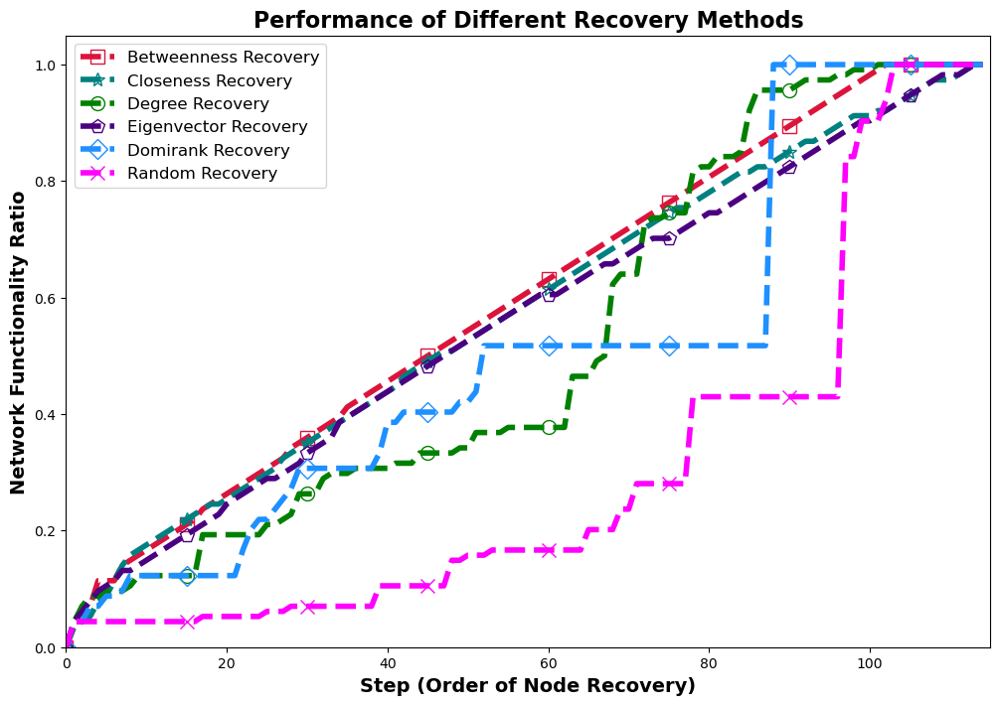

In [85]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import os
import imageio.v2 as imageio

# Create a directory to save frames
output_folder = "serdp_visuals"
recovery_frames_folder = os.path.join(output_folder, "frames_recovery")
os.makedirs(recovery_frames_folder, exist_ok=True)

# Assuming you have recovery performance data for different recovery methods
recovery_performance_data = {
    "Betweenness": recovery_performance_betweenness,
    "Closeness": recovery_performance_closeness,
    "Degree": recovery_performance_degree,
    "Eigenvector": recovery_performance_eigen,
    "Domirank": recovery_performance_domirank,  # Add Domirank
    "Random": recovery_performance_random  # Add Random recovery
}

# Parameters for plotting
colors = ['crimson', 'teal', 'green', 'indigo', 'dodgerblue', 'fuchsia']  # Add a color for each method
marker_style = ['s', '*', 'o', 'p', 'D', 'x']  # Add a marker style for each method
Q = 4  # Increased line width for better visibility

# Create a figure for animation
fig, ax = plt.subplots(figsize=(12, 8))  # Larger figure for clarity
ax.set_xlabel('Step (Order of Node Recovery)', fontsize=14, fontweight='bold')
ax.set_ylabel('Network Functionality Ratio', fontsize=14, fontweight='bold')
ax.set_title('Performance of Different Recovery Methods', fontsize=16, fontweight='bold')

# Create lines for each recovery method
recovery_lines = {}
for method, color, marker in zip(recovery_performance_data.keys(), colors, marker_style):
    line, = ax.plot([], [], label=f'{method} Recovery', color=color, linestyle='--',
                    marker=marker, markevery=15, markerfacecolor='none',
                    markersize=10, linewidth=Q)
    recovery_lines[method] = line

# Add legend with increased font size
ax.legend(fontsize=12)

# Set axis limits
ax.set_xlim(0, max(len(data) for data in recovery_performance_data.values()))
ax.set_ylim(0, 1.05)

# Animation function
def update_recovery(frame):
    for method, data in recovery_performance_data.items():
        recovery_lines[method].set_data(range(frame + 1), data[:frame + 1])

    plt.savefig(os.path.join(recovery_frames_folder, f"frame_{frame:03d}.png"))
    return recovery_lines.values()

# Create animation
recovery_num_frames = max(len(data) for data in recovery_performance_data.values())
recovery_ani = animation.FuncAnimation(fig, update_recovery, frames=recovery_num_frames, blit=True, repeat=False)

# Save the animation as a GIF
recovery_gif_path = os.path.join(output_folder, "recovery_performance_comparison.gif")
recovery_ani.save(recovery_gif_path, writer="pillow", fps=15)  # Adjusted fps for smoother animation
print(f"GIF saved at {recovery_gif_path}")

# Optional: Combine all frames into a video (requires ffmpeg or similar tools)
video_enabled = False  # Set to True to enable video-saving code
if video_enabled:
    recovery_video_path = os.path.join(output_folder, "recovery_performance_comparison.mp4")
    with imageio.get_writer(recovery_video_path, mode="I", fps=15) as writer:
        for frame_num in range(recovery_num_frames):
            frame_path = os.path.join(recovery_frames_folder, f"frame_{frame_num:03d}.png")
            image = imageio.imread(frame_path)
            writer.append_data(image)
    print(f"Video saved at {recovery_video_path}")

# Cleanup: Uncomment if you want to remove individual frames
# for frame_num in range(recovery_num_frames):
#     os.remove(os.path.join(recovery_frames_folder, f"frame_{frame_num:03d}.png"))


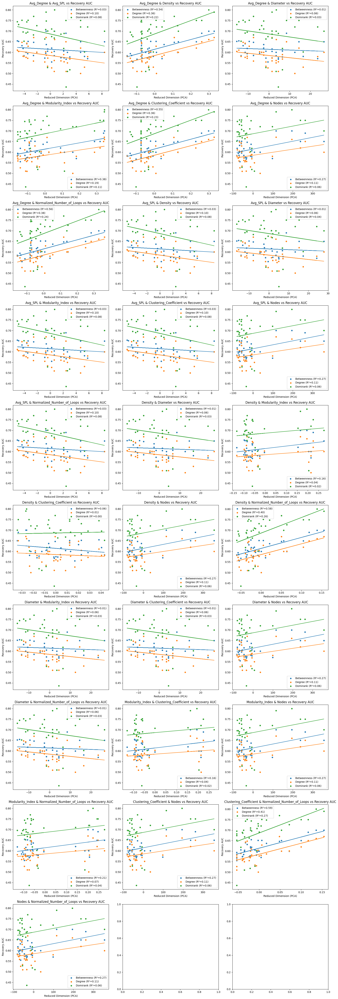

R² Values for Each Combination of Attributes:

Combination: Avg_Degree & Avg_SPL
  Betweenness: R² = 0.03
  Degree: R² = 0.10
  Domirank: R² = 0.08

Combination: Avg_Degree & Density
  Betweenness: R² = 0.54
  Degree: R² = 0.36
  Domirank: R² = 0.22

Combination: Avg_Degree & Diameter
  Betweenness: R² = 0.01
  Degree: R² = 0.06
  Domirank: R² = 0.03

Combination: Avg_Degree & Modularity_Index
  Betweenness: R² = 0.38
  Degree: R² = 0.19
  Domirank: R² = 0.11

Combination: Avg_Degree & Clustering_Coefficient
  Betweenness: R² = 0.55
  Degree: R² = 0.36
  Domirank: R² = 0.23

Combination: Avg_Degree & Nodes
  Betweenness: R² = 0.27
  Degree: R² = 0.11
  Domirank: R² = 0.06

Combination: Avg_Degree & Normalized_Number_of_Loops
  Betweenness: R² = 0.56
  Degree: R² = 0.38
  Domirank: R² = 0.24

Combination: Avg_SPL & Density
  Betweenness: R² = 0.03
  Degree: R² = 0.10
  Domirank: R² = 0.08

Combination: Avg_SPL & Diameter
  Betweenness: R² = 0.01
  Degree: R² = 0.06
  Domirank: R² = 0.04

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
import pickle
import pandas as pd

# Load the results from the pickle file
with open('recovery_results.pkl', 'rb') as f:
    results = pickle.load(f)

# Extract network attributes and recovery AUC scores from results
network_attr_df = pd.DataFrame({city: res for city, res in results.items()}).T  # Extract network attributes
auc_df = pd.DataFrame({city: res['Recovery_AUC'] for city, res in results.items()}).T  # Extract Recovery AUC

# List of topological metrics and recovery methods
topological_metrics = ['Avg_Degree', 'Avg_SPL', 'Density', 'Diameter', 'Modularity_Index', 'Clustering_Coefficient', 'Nodes', 'Normalized_Number_of_Loops']
# recovery_methods = ['Closeness','Eigen','Betweenness', 'Degree', 'Domirank']
recovery_methods = ['Betweenness', 'Degree', 'Domirank']

# Function to plot reduced-dimension feature against AUC with all methods
def plot_combined_reduced_dim(attr1, attr2, auc_df, ax):
    # Combine the two attributes and reduce to one dimension using PCA
    combined_features = network_attr_df[[attr1, attr2]].values
    pca = PCA(n_components=1)
    reduced_feature = pca.fit_transform(combined_features).flatten()

    # Dictionary to store R² values
    r2_values = {}

    # Plot each recovery method
    colors = sns.color_palette("tab10", len(recovery_methods))
    for method, color in zip(recovery_methods, colors):
        auc_values = auc_df[method]

        # Fit a linear regression line
        model = LinearRegression()
        x_array = reduced_feature.reshape(-1, 1)
        model.fit(x_array, auc_values)
        trendline = model.predict(x_array)
        r2 = model.score(x_array, auc_values)  # Calculate R² value

        # Add to R² dictionary
        r2_values[method] = r2

        # Plot scatter and trendline
        sns.scatterplot(x=reduced_feature, y=auc_values, ax=ax, label=f"{method} (R²={r2:.2f})", color=color)
        ax.plot(reduced_feature, trendline, color=color)

    # Plot settings
    ax.set_title(f"{attr1} & {attr2} vs Recovery AUC")
    ax.set_xlabel("Reduced Dimension (PCA)")
    ax.set_ylabel("Recovery AUC")
    ax.legend()

    return r2_values

# Generate plots for each combination of attributes
r2_results = {}
fig, axes = plt.subplots(10, 3, figsize=(18, 18*3))
axes = axes.flatten()

for i, (attr1, attr2) in enumerate([(attr1, attr2) for idx, attr1 in enumerate(topological_metrics) for attr2 in topological_metrics[idx + 1:]]):
    if i >= len(axes):
        break

    # Plot each combination and collect R² values
    ax = axes[i]
    r2_results[f"{attr1} & {attr2}"] = plot_combined_reduced_dim(attr1, attr2, auc_df, ax)

# Adjust layout and save the figure
plt.tight_layout()
# plt.savefig("combined_reduced_dim_vs_recovery_auc.png")
plt.show()

# Print the R² values
print("R² Values for Each Combination of Attributes:")
for combination, methods_r2 in r2_results.items():
    print(f"\nCombination: {combination}")
    for method, r2 in methods_r2.items():
        print(f"  {method}: R² = {r2:.2f}")


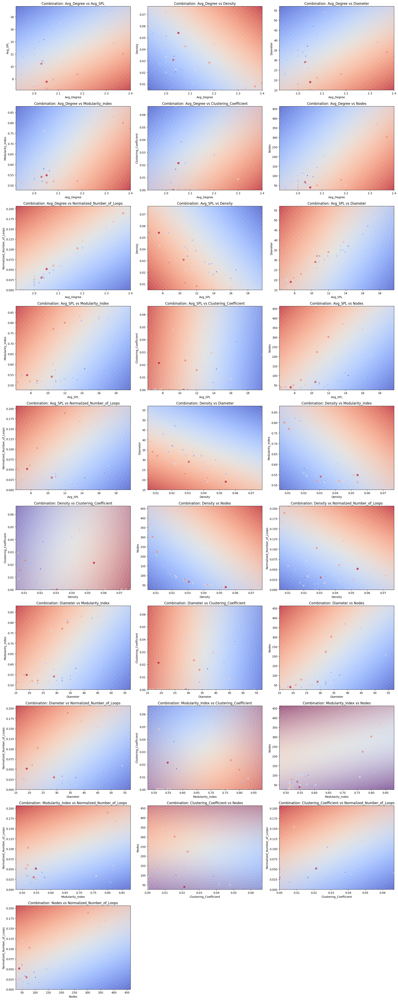

R² Values and Correlation Analysis for Each Combination and Method:

Combination: Avg_Degree + Avg_SPL
  Domirank: R² = 0.43, Avg_Degree: Positive, Avg_SPL: Negative, Dominant: Avg_Degree
  Betweenness: R² = 0.71, Avg_Degree: Positive, Avg_SPL: Negative, Dominant: Avg_Degree
  Degree: R² = 0.64, Avg_Degree: Positive, Avg_SPL: Negative, Dominant: Avg_Degree
  Closeness: R² = 0.76, Avg_Degree: Negative, Avg_SPL: Negative, Dominant: Avg_SPL
  Eigen: R² = 0.62, Avg_Degree: Positive, Avg_SPL: Negative, Dominant: Avg_SPL
  Random: R² = 0.49, Avg_Degree: Positive, Avg_SPL: Negative, Dominant: Avg_SPL

Combination: Avg_Degree + Density
  Domirank: R² = 0.39, Avg_Degree: Positive, Density: Positive, Dominant: Avg_Degree
  Betweenness: R² = 0.64, Avg_Degree: Positive, Density: Negative, Dominant: Avg_Degree
  Degree: R² = 0.51, Avg_Degree: Positive, Density: Negative, Dominant: Avg_Degree
  Closeness: R² = 0.48, Avg_Degree: Negative, Density: Positive, Dominant: Density
  Eigen: R² = 0.36, Avg_D

In [7]:
# Re-import necessary libraries after execution state reset
import itertools
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.linear_model import LinearRegression
import pickle
import pandas as pd
from scipy.stats import pearsonr

# Reload the recovery_results.pkl file
file_path = "recovery_results.pkl"
with open(file_path, 'rb') as f:
    recovery_results = pickle.load(f)

# Extract network attributes and recovery AUC scores from results
network_attr_df = pd.DataFrame({city: res for city, res in recovery_results.items()}).T  # Extract network attributes
auc_df = pd.DataFrame({city: res['Recovery_AUC'] for city, res in recovery_results.items()}).T  # Extract Recovery AUC

# Prepare data for graphing
topological_metrics = ['Avg_Degree', 'Avg_SPL', 'Density', 'Diameter', 'Modularity_Index', 
                       'Clustering_Coefficient', 'Nodes', 'Normalized_Number_of_Loops']
recovery_methods = ['Domirank', 'Betweenness', 'Degree', 'Closeness', 'Eigen', 'Random']

# Generate all pairwise combinations of topological metrics
metric_combinations = list(itertools.combinations(topological_metrics, 2))

# Function to create scatter plot with regression plane and correlation analysis
def plot_combination_with_trendline(x, y, auc, ax, method, metric_x, metric_y):
    sns.scatterplot(x=x, y=y, size=auc, ax=ax, hue=auc, palette="coolwarm", legend=False, alpha=0.8)

    # Fit a multiple linear regression model
    model = LinearRegression()
    X_comb = np.column_stack((x, y))
    model.fit(X_comb, auc)
    auc_pred = model.predict(X_comb)

    # Compute Pearson correlation for each attribute with AUC
    corr_x, _ = pearsonr(x, auc)
    corr_y, _ = pearsonr(y, auc)

    # Determine dominant attribute
    dominant_attr = "Both equally" if abs(corr_x) == abs(corr_y) else (metric_x if abs(corr_x) > abs(corr_y) else metric_y)
    
    # Identify correlation direction
    corr_x_label = "Positive" if corr_x > 0 else "Negative"
    corr_y_label = "Positive" if corr_y > 0 else "Negative"

    # Create a grid for regression plane
    x_min, x_max = np.min(x), np.max(x)
    y_min, y_max = np.min(y), np.max(y)
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 50), np.linspace(y_min, y_max, 50))
    zz = model.predict(np.column_stack((xx.ravel(), yy.ravel()))).reshape(xx.shape)

    ax.contourf(xx, yy, zz, alpha=0.2, levels=50, cmap="coolwarm")  # Add regression plane

    return model.score(X_comb, auc), corr_x_label, corr_y_label, dominant_attr  # Return R² value and correlation info

# Determine the number of subplots needed
n_combinations = len(metric_combinations)  # Number of combinations
n_cols = 3  # Adjust columns to fit layout
n_rows = (n_combinations + n_cols - 1) // n_cols  # Ceiling division to get enough rows

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))
axes = axes.flatten()

# Collect R^2 values for combinations
r2_comb_results = {}

# Iterate through combinations and plot
for i, (metric_x, metric_y) in enumerate(metric_combinations):
    ax = axes[i]
    r2_comb_results[f"{metric_x} + {metric_y}"] = {}

    for method in recovery_methods:
        x = network_attr_df[metric_x]
        y = network_attr_df[metric_y]
        auc = auc_df[method]

        r2, corr_x_label, corr_y_label, dominant_attr = plot_combination_with_trendline(x, y, auc, ax, method, metric_x, metric_y)
        r2_comb_results[f"{metric_x} + {metric_y}"][method] = {
            "R²": r2, 
            "Corr_X": corr_x_label, 
            "Corr_Y": corr_y_label, 
            "Dominant": dominant_attr
        }

    ax.set_title(f'Combination: {metric_x} vs {metric_y}')
    ax.set_xlabel(metric_x)
    ax.set_ylabel(metric_y)

# Remove any unused subplots
if len(axes) > n_combinations:
    for idx in range(n_combinations, len(axes)):
        fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

# Print the R^2 values and correlation analysis for combinations
print("R² Values and Correlation Analysis for Each Combination and Method:")
for combination, method_r2 in r2_comb_results.items():
    print(f"\nCombination: {combination}")
    for method, values in method_r2.items():
        print(f"  {method}: R² = {values['R²']:.2f}, {combination.split(' + ')[0]}: {values['Corr_X']}, {combination.split(' + ')[1]}: {values['Corr_Y']}, Dominant: {values['Dominant']}")


Time taken: 0.06 seconds

Node Readdition Sequence:
Betweenness Recovery: [36, 59, 77, 6, 20, 55, 39, 14, 17, 16, 18, 90, 95, 78, 89, 43, 97, 47, 24, 9, 52, 62, 4, 76, 60, 26, 80, 57, 53, 31, 51, 91, 25, 103, 72, 105, 5, 49, 35, 13, 73, 10, 66, 3, 101]
Degree Recovery: [97, 39, 47, 77, 59, 72, 53, 57, 36, 64, 110, 8, 100, 34, 31, 105, 10, 65, 88, 87, 56, 98, 48, 84, 12, 99, 75, 113, 1, 66, 5, 37, 79, 50, 27, 58, 28, 95, 24, 4, 92, 45, 94, 71, 111]
Random Recovery: [21, 52, 45, 103, 1, 110, 39, 56, 28, 76, 16, 113, 35, 96, 25, 82, 89, 111, 66, 91, 106, 95, 19, 87, 102, 57, 18, 34, 31, 62, 99, 36, 23, 4, 60, 64, 85, 37, 83, 7, 88, 105, 11, 75, 97]


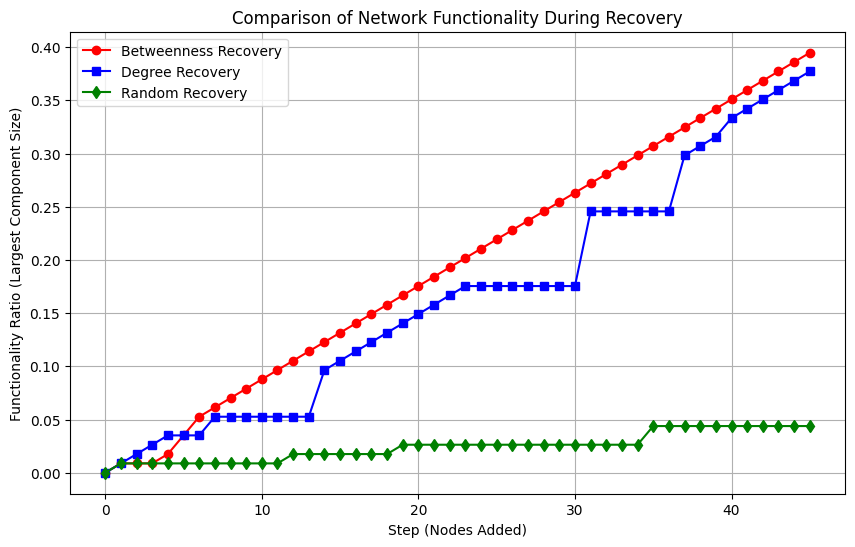

In [25]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import copy
import pickle
import time

# Load the graph
with open(rf"C:\Users\orije\recoverability\spaces\L\L-Lyon.pkl", 'rb') as file:
    bos_G = pickle.load(file)

# Convert to undirected graph
agg_G = nx.Graph()
agg_G.add_nodes_from(bos_G.nodes(data=True))
for u, v in bos_G.edges():
    agg_G.add_edge(u, v)

agg_G = G_B

# Function to calculate largest connected component (LCC) size
def calculate_network_performance(G):
    if len(G) == 0:
        return 0
    return max(len(c) for c in nx.connected_components(G))


# Function to simulate recovery and return node readdition sequence
def simulate_recovery(G, sigma, strategy):
    H = nx.Graph()  # Start with an empty graph
    removed_nodes = list(G.nodes)
    removed_edges = list(G.edges)
    num_nodes_to_add = int(sigma * len(G.nodes))
    recovery_performance = []
    node_readdition_sequence = []
    initial_performance = 0  # No connected components initially

    # Select nodes based on strategy
    if strategy == "betweenness":
        centrality = nx.betweenness_centrality(G)
        nodes_sorted = sorted(G.nodes, key=lambda n: centrality[n], reverse=True)
    elif strategy == "degree":
        nodes_sorted = sorted(G.nodes, key=lambda n: G.degree[n], reverse=True)
    elif strategy == "random":
        nodes_sorted = np.random.choice(G.nodes, len(G.nodes), replace=False)

    recovery_performance.append(0)  # Initial state (0% functionality)

    for i in range(num_nodes_to_add):
        if nodes_sorted[i] in removed_nodes:
            H.add_node(nodes_sorted[i])
            node_readdition_sequence.append(nodes_sorted[i])  # Store added node

            # Reconnect edges if both nodes exist
            for u, v in removed_edges:
                if u in H.nodes and v in H.nodes:
                    H.add_edge(u, v)

        current_performance = calculate_network_performance(H)
        functionality_ratio = current_performance / len(G)
        recovery_performance.append(functionality_ratio)

    return recovery_performance, node_readdition_sequence

# Set fraction of nodes to add back
sigma = 0.4  # 10% recovery

# Run recovery simulations
start_time = time.time()
recovery_performance_betweenness, added_betweenness = simulate_recovery(agg_G, sigma, "betweenness")
recovery_performance_degree, added_degree = simulate_recovery(agg_G, sigma, "degree")
recovery_performance_random, added_random = simulate_recovery(agg_G, sigma, "random")
end_time = time.time()

# Print execution time
print(f"Time taken: {end_time - start_time:.2f} seconds")

# Print node readdition sequence
print("\nNode Readdition Sequence:")
print(f"Betweenness Recovery: {added_betweenness}")
print(f"Degree Recovery: {added_degree}")
print(f"Random Recovery: {added_random}")

# Function to plot all recovery strategies in one graph
def plot_functionality_comparison(betweenness, degree, random):
    plt.figure(figsize=(10, 6))
    steps = list(range(len(betweenness)))

    plt.plot(steps, betweenness, marker='o', linestyle='-', label="Betweenness Recovery", color="red")
    plt.plot(steps, degree, marker='s', linestyle='-', label="Degree Recovery", color="blue")
    plt.plot(steps, random, marker='d', linestyle='-', label="Random Recovery", color="green")

    plt.title('Comparison of Network Functionality During Recovery')
    plt.xlabel('Step (Nodes Added)')
    plt.ylabel('Functionality Ratio (Largest Component Size)')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot the results
plot_functionality_comparison(recovery_performance_betweenness, recovery_performance_degree, recovery_performance_random)


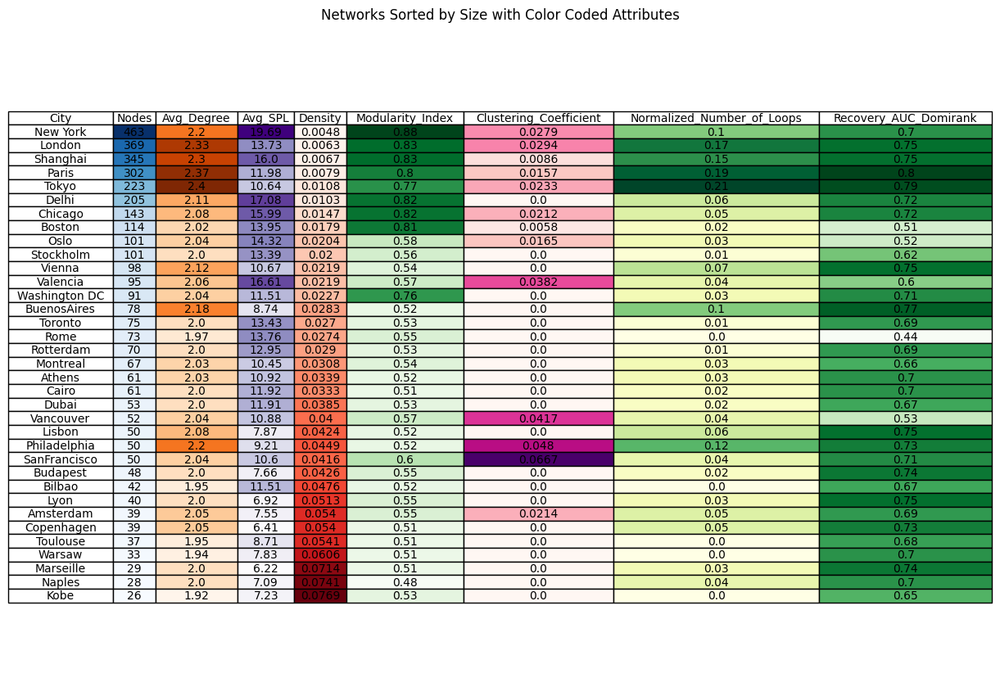

In [2]:
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load recovery results
with open('recovery_results.pkl', 'rb') as f:
    recovery_results = pickle.load(f)

# Extract relevant data
data = []
for city, attributes in recovery_results.items():
    data.append({
        "City": city,
        "Nodes": round(attributes["Nodes"], 2),  # Network size
        "Avg_Degree": round(attributes["Avg_Degree"], 2),
        "Avg_SPL": round(attributes["Avg_SPL"], 2),
        "Density": round(attributes["Density"], 4),
        "Modularity_Index": round(attributes["Modularity_Index"], 2),
        "Clustering_Coefficient": round(attributes["Clustering_Coefficient"], 4),
        "Normalized_Number_of_Loops": round(attributes["Normalized_Number_of_Loops"], 2),
        "Recovery_AUC_Domirank": round(attributes["Recovery_AUC"]["Domirank"], 2)
    })

# Convert to DataFrame
df = pd.DataFrame(data)

# Sort by Nodes (network size) in descending order
df_sorted = df.sort_values(by="Nodes", ascending=False).reset_index(drop=True)

# Normalize each column separately for color mapping
norm_nodes = plt.Normalize(df_sorted["Nodes"].min(), df_sorted["Nodes"].max())
norm_avg_degree = plt.Normalize(df_sorted["Avg_Degree"].min(), df_sorted["Avg_Degree"].max())
norm_avg_spl = plt.Normalize(df_sorted["Avg_SPL"].min(), df_sorted["Avg_SPL"].max())
norm_density = plt.Normalize(df_sorted["Density"].min(), df_sorted["Density"].max())
norm_modularity = plt.Normalize(df_sorted["Modularity_Index"].min(), df_sorted["Modularity_Index"].max())
norm_clustering = plt.Normalize(df_sorted["Clustering_Coefficient"].min(), df_sorted["Clustering_Coefficient"].max())
norm_loops = plt.Normalize(df_sorted["Normalized_Number_of_Loops"].min(), df_sorted["Normalized_Number_of_Loops"].max())
norm_auc = plt.Normalize(df_sorted["Recovery_AUC_Domirank"].min(), df_sorted["Recovery_AUC_Domirank"].max())

# Generate color maps for each attribute
colors_nodes = plt.cm.Blues(norm_nodes(df_sorted["Nodes"]))
colors_avg_degree = plt.cm.Oranges(norm_avg_degree(df_sorted["Avg_Degree"]))
colors_avg_spl = plt.cm.Purples(norm_avg_spl(df_sorted["Avg_SPL"]))
colors_density = plt.cm.Reds(norm_density(df_sorted["Density"]))
colors_modularity = plt.cm.Greens(norm_modularity(df_sorted["Modularity_Index"]))
colors_clustering = plt.cm.RdPu(norm_clustering(df_sorted["Clustering_Coefficient"]))  # Using Red-Purple instead of "Pink"
colors_loops = plt.cm.YlGn(norm_loops(df_sorted["Normalized_Number_of_Loops"]))
colors_auc = plt.cm.Greens(norm_auc(df_sorted["Recovery_AUC_Domirank"]))

# Plot table
fig, ax = plt.subplots(figsize=(12, len(df_sorted) * 0.3))
ax.set_frame_on(False)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

# Define colors for the table (color each numerical column separately)
cell_colors = [["white"] * len(df_sorted.columns) for _ in range(len(df_sorted))]  # Default white
for i in range(len(df_sorted)):
    cell_colors[i][1] = colors_nodes[i]  # Nodes
    cell_colors[i][2] = colors_avg_degree[i]  # Avg Degree
    cell_colors[i][3] = colors_avg_spl[i]  # Avg SPL
    cell_colors[i][4] = colors_density[i]  # Density
    cell_colors[i][5] = colors_modularity[i]  # Modularity Index
    cell_colors[i][6] = colors_clustering[i]  # Clustering Coefficient
    cell_colors[i][7] = colors_loops[i]  # Normalized Number of Loops
    cell_colors[i][8] = colors_auc[i]  # Recovery AUC Domirank

# Create the table
table = ax.table(cellText=df_sorted.values, 
                 colLabels=df_sorted.columns,
                 cellLoc="center", 
                 loc="center",
                 cellColours=cell_colors)  # Apply colors per column

table.auto_set_font_size(False)
table.set_fontsize(10)
table.auto_set_column_width(list(range(len(df_sorted.columns))))  # Adjust column width

plt.title("Networks Sorted by Size with Color Coded Attributes", fontsize=12)
plt.show()


In [138]:
import pandas as pd
import numpy as np
import pickle
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Load recovery results
with open('recovery_results.pkl', 'rb') as f:
    recovery_results = pickle.load(f)

# Extract relevant data
data = []
for city, attributes in recovery_results.items():
    data.append({
        "City": city,
        "Nodes": attributes["Nodes"],
        "Avg_Degree": attributes["Avg_Degree"],
        "Avg_SPL": attributes["Avg_SPL"],
        "Diameter": attributes["Diameter"],
        "Density": attributes["Density"],
        "Modularity_Index": attributes["Modularity_Index"],
        "Clustering_Coefficient": attributes["Clustering_Coefficient"],
        "Normalized_Number_of_Loops": attributes["Normalized_Number_of_Loops"],
        "Recovery_AUC_Domirank": attributes["Recovery_AUC"]["Domirank"]
    })

# Convert to DataFrame
df = pd.DataFrame(data)

# Drop non-numeric columns
df_numeric = df.drop(columns=["City", "Recovery_AUC_Domirank"])  # AUC is dependent variable

# Standardize features (optional, helps improve VIF interpretation)
df_numeric = (df_numeric - df_numeric.mean()) / df_numeric.std()

# Compute VIF scores
vif_data = pd.DataFrame()
vif_data["Feature"] = df_numeric.columns
vif_data["VIF"] = [variance_inflation_factor(df_numeric.values, i) for i in range(df_numeric.shape[1])]

# Print results
print("\n📌 Variance Inflation Factor (VIF) Scores for Recovery:")
print(vif_data.sort_values(by="VIF", ascending=False))



📌 Variance Inflation Factor (VIF) Scores for Recovery:
                      Feature          VIF
1                  Avg_Degree  7674.960482
7  Normalized_Number_of_Loops  6360.423328
4                     Density   210.954039
2                     Avg_SPL    58.317516
3                    Diameter    39.852466
0                       Nodes     9.115680
5            Modularity_Index     4.297600
6      Clustering_Coefficient     1.748464



📌 **Fitted XGBoost Approximation Equation:**
Recovery AUC ≈ 0.6863 + (0.2164 * Density) + (0.2549 * Modularity_Index) + (0.0986 * Clustering_Coefficient) + (0.4302 * Normalized_Number_of_Loops)

📊 **Model Performance (R² Score):** 0.9999


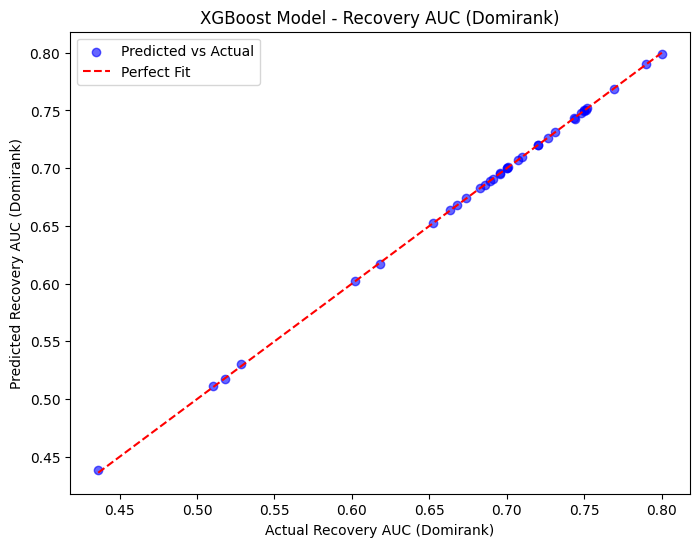

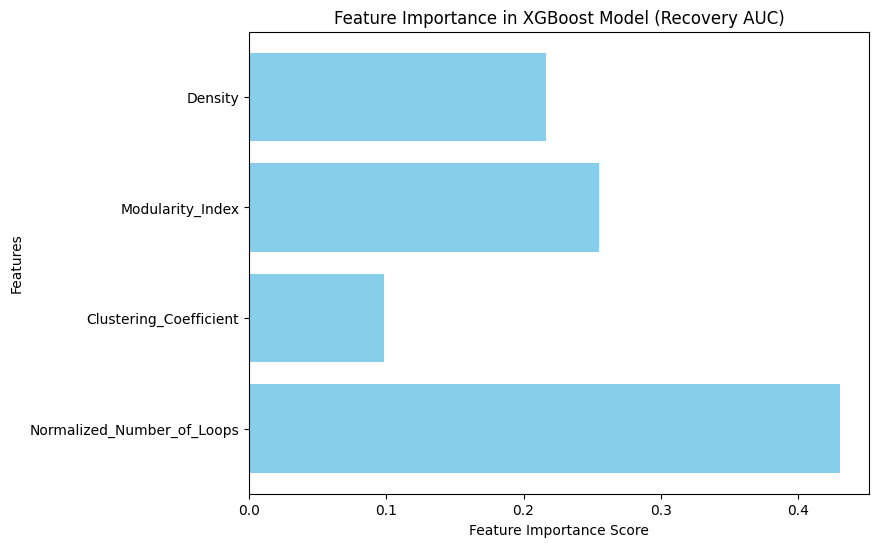

In [144]:
import xgboost as xgb
import numpy as np
import pandas as pd
import pickle
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt


# Define independent variables (X) and dependent variable (y)
# X = df[["Avg_SPL", "Modularity_Index", "Clustering_Coefficient","Normalized_Number_of_Loops","Density","Nodes","Diameter","Avg_Degree"]]
X = df[["Density","Modularity_Index", "Clustering_Coefficient","Normalized_Number_of_Loops"]]
y = df["Recovery_AUC_Domirank"]

# Train XGBoost model on full dataset
model = xgb.XGBRegressor(objective="reg:squarederror", n_estimators=100, random_state=42)
model.fit(X, y)

# Get feature importance
importance = model.feature_importances_
feature_names = X.columns

# Normalize feature importance
coefficients = importance / importance.sum()

# Use mean of predictions as intercept
intercept = np.mean(y)

# Generate approximation equation
equation = "Recovery AUC ≈ {:.4f}".format(intercept)
for i, coef in enumerate(coefficients):
    equation += " + ({:.4f} * {})".format(coef, feature_names[i])

# Predict values for performance evaluation
y_pred = model.predict(X)
r2 = r2_score(y, y_pred)

# Print results
print("\n📌 **Fitted XGBoost Approximation Equation:**")
print(equation)
print(f"\n📊 **Model Performance (R² Score):** {r2:.4f}")

# Plot actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y, y_pred, color="blue", alpha=0.6, label="Predicted vs Actual")
plt.plot([min(y), max(y)], [min(y), max(y)], color="red", linestyle="--", label="Perfect Fit")
plt.xlabel("Actual Recovery AUC (Domirank)")
plt.ylabel("Predicted Recovery AUC (Domirank)")
plt.title("XGBoost Model - Recovery AUC (Domirank)")
plt.legend()
plt.show()

# Plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(feature_names, importance, color="skyblue")
plt.xlabel("Feature Importance Score")
plt.ylabel("Features")
plt.title("Feature Importance in XGBoost Model (Recovery AUC)")
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()

In [9]:
import pickle
import pandas as pd
import numpy as np
from sklearn.feature_selection import mutual_info_regression

# Load recovery results
with open('recovery_results.pkl', 'rb') as f:
    recovery_results = pickle.load(f)

# List of recovery methods to evaluate
methods = ["Domirank", "Betweenness", "Degree", "Closeness", "Eigen", "Random"]

# Extract attribute and AUC data
rows = []
for city, attributes in recovery_results.items():
    row = {
        "City": city,
        "Nodes": attributes["Nodes"],
        "Avg_Degree": attributes["Avg_Degree"],
        "Avg_SPL": attributes["Avg_SPL"],
        "Density": attributes["Density"],
        "Modularity_Index": attributes["Modularity_Index"],
        "Clustering_Coefficient": attributes["Clustering_Coefficient"],
        "Normalized_Number_of_Loops": attributes["Normalized_Number_of_Loops"]
    }
    for method in methods:
        row[f"AUC_{method}"] = attributes["Recovery_AUC"].get(method, np.nan)
    rows.append(row)

# Convert to DataFrame
df = pd.DataFrame(rows)
attribute_cols = [
    "Nodes", "Avg_Degree", "Avg_SPL", "Density",
    "Modularity_Index", "Clustering_Coefficient", "Normalized_Number_of_Loops"
]

# Compute mutual information for each method
all_mi_tables = []
# Print mutual information scores in separate tables for each strategy
for method in methods:
    mi_table = combined_mi_df[combined_mi_df["Method"] == method].copy()
    if mi_table.empty:
        print(f"\n⚠️ No data available for {method}. Skipping.\n")
        continue

    print(f"\n📊 Mutual Information Scores for Recovery Strategy: {method}")
    print(mi_table[["Feature", "Mutual Information"]].sort_values(by="Mutual Information", ascending=False).to_string(index=False))




📊 Mutual Information Scores for Recovery Strategy: Domirank
                   Feature  Mutual Information
Normalized_Number_of_Loops            0.302233
                Avg_Degree            0.219614
                     Nodes            0.113003
          Modularity_Index            0.077021
                   Density            0.048196
                   Avg_SPL            0.000000
    Clustering_Coefficient            0.000000

📊 Mutual Information Scores for Recovery Strategy: Betweenness
                   Feature  Mutual Information
Normalized_Number_of_Loops            0.236470
                Avg_Degree            0.169087
                   Density            0.129867
                     Nodes            0.129305
                   Avg_SPL            0.072925
          Modularity_Index            0.056456
    Clustering_Coefficient            0.006956

📊 Mutual Information Scores for Recovery Strategy: Degree
                   Feature  Mutual Information
Normalized_Number

## visuals for paper results saving

In [34]:
import os
import pickle
import numpy as np
import networkx as nx

# === Load all city graphs ===
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

# === Utility to calculate area under the recovery curve ===
def plot_area_recovery(recovery_performance, label):
    if not recovery_performance or max(recovery_performance) == 0:
        return 0.0
    max_ratio = max(recovery_performance)
    scaled = [val / max_ratio for val in recovery_performance]
    steps = list(range(1, len(scaled) + 1))
    area = np.trapz(scaled, steps)
    normalized = area / len(scaled)
    print(f"Normalized area under the {label} recovery curve: {normalized:.2f}")
    return float(normalized)

# === Extract network attributes ===
import networkx as nx
import numpy as np

def extract_network_attributes(G):
    num_nodes = G.number_of_nodes()
    avg_degree = np.mean([d for n, d in G.degree()])
    avg_spl = nx.average_shortest_path_length(G) if nx.is_connected(G) else float('inf')
    density = nx.density(G)
    diameter = nx.diameter(G) if nx.is_connected(G) else float('inf')
    modularity_index = nx.algorithms.community.modularity(G, nx.algorithms.community.label_propagation_communities(G))
    clustering_coeff = nx.average_clustering(G)

    # Loops
    num_loops = sum(1 for cycle in nx.cycle_basis(G))
    normalized_number_loops = num_loops / num_nodes if num_nodes > 0 else 0

    # Connectivity
    algebraic_conn = nx.algebraic_connectivity(G) if nx.is_connected(G) else np.nan

    # Structural
    assortativity = nx.degree_assortativity_coefficient(G)
    rich_club_coeff = np.mean(list(nx.rich_club_coefficient(G, normalized=False).values()))
    transitivity = nx.transitivity(G)

    # Efficiency & Path
    global_eff = nx.global_efficiency(G)
    local_eff = nx.local_efficiency(G)
    avg_eccentricity = np.mean(list(nx.eccentricity(G).values())) if nx.is_connected(G) else np.nan

    # Entropy
    degree_sequence = [deg for _, deg in G.degree()]
    prob_degree = np.array([degree_sequence.count(i) / len(degree_sequence) for i in set(degree_sequence)])
    network_entropy = -np.sum(prob_degree * np.log(prob_degree + 1e-12))
    degrees = [d for _, d in G.degree()]

    return {
        "Nodes": num_nodes,
        "Avg_Degree": avg_degree,
        "Avg_SPL": avg_spl,
        "Density": density,
        "Diameter": diameter,
        "Modularity_Index": modularity_index,
        "Clustering_Coefficient": clustering_coeff,
        "Number_of_Loops": num_loops,
        "Normalized_Number_of_Loops": normalized_number_loops,
        "Algebraic_Connectivity": algebraic_conn,
        "Assortativity": assortativity,
        "Rich_Club_Coefficient": rich_club_coeff,
        "Transitivity": transitivity,
        "Global_Efficiency": global_eff,
        "Local_Efficiency": local_eff,
        "Avg_Eccentricity": avg_eccentricity,
        "Network_Entropy": network_entropy,
        "CV": np.std(degrees) / np.mean(degrees)
    }


# === Recovery strategies ===
recovery_methods = {
    "Degree": simulate_recovery_degree,
    "Betweenness": simulate_recovery_betweenness,
    "Random": simulate_recovery_random,
    "Eigen": simulate_recovery_eigen,
    "Closeness": simulate_recovery_closeness,
    "Domirank": simulate_recovery_domirank,
    "Greedy": simulate_recovery_greedy
}

# === Final recovery results ===
recovery_results = {}

# === Run for all cities ===
for city_name, G in networks.items():
    print(f"\n▶ Running recovery simulations for {city_name}")

    nodes_to_remove = list(G.nodes())
    np.random.shuffle(nodes_to_remove)

    recovery_auc = {}
    recovery_series = {}
    network_attributes = extract_network_attributes(G)

    for method_name, recovery_func in recovery_methods.items():
        print(f"  → {method_name} recovery")

        if method_name == "Random":
            all_runs = []
            all_aucs = []
        
            for _ in range(50):
                perf, _ = recovery_func(G.copy(), nodes_to_remove)
                perf = [0] + perf  # Start from empty graph
                auc = plot_area_recovery(perf, f"{method_name}")
                all_runs.append(perf)
                all_aucs.append(auc)
        
            # Pad runs to same length
            max_len = max(len(run) for run in all_runs)
            padded_runs = [run + [run[-1]] * (max_len - len(run)) for run in all_runs]
            perf_array = np.array(padded_runs)
        
            # === Compute mean and 95% confidence bounds
            mean_curve = np.mean(perf_array, axis=0)
            std_curve = np.std(perf_array, axis=0, ddof=1)
            ci_margin = 1.96 * std_curve / np.sqrt(len(all_runs))
            upper_bound = mean_curve + ci_margin
            lower_bound = mean_curve - ci_margin
            assert np.all((mean_curve >= lower_bound) & (mean_curve <= upper_bound)), "Mean curve fell outside CI!"


            
            # === Save in results
            recovery_auc[method_name] = np.trapz(mean_curve, dx=1) / len(mean_curve)  # Area under mean curve
            recovery_series[method_name] = mean_curve.tolist()                        # Save mean curve as main
            recovery_series["Random_CI_Upper"] = upper_bound.tolist()
            recovery_series["Random_CI_Lower"] = lower_bound.tolist()



        else:
            perf, _ = recovery_func(G.copy(), nodes_to_remove)
            auc = plot_area_recovery(perf, f"{method_name}")
            recovery_auc[method_name] = auc
            recovery_series[method_name] = perf

    recovery_results[city_name] = {
        "network_attributes": network_attributes,
        "recovery_auc": recovery_auc,
        "performance_series": recovery_series
    }

# === Save the full recovery data ===
os.makedirs("simulation_results", exist_ok=True)
with open("simulation_results/recovery_results.pkl", "wb") as f:
    pickle.dump(recovery_results, f)

print("\n✅ All recovery results (with network attributes) saved to 'visuals_for_paper/recovery_results.pkl'")



▶ Running recovery simulations for WashingtonDc
  → Degree recovery
Normalized area under the Degree recovery curve: 0.56
  → Betweenness recovery
Normalized area under the Betweenness recovery curve: 0.61
  → Random recovery
Normalized area under the Random recovery curve: 0.40
Normalized area under the Random recovery curve: 0.52
Normalized area under the Random recovery curve: 0.39
Normalized area under the Random recovery curve: 0.44
Normalized area under the Random recovery curve: 0.38
Normalized area under the Random recovery curve: 0.44
Normalized area under the Random recovery curve: 0.48
Normalized area under the Random recovery curve: 0.47
Normalized area under the Random recovery curve: 0.42
Normalized area under the Random recovery curve: 0.49
Normalized area under the Random recovery curve: 0.39
Normalized area under the Random recovery curve: 0.43
Normalized area under the Random recovery curve: 0.48
Normalized area under the Random recovery curve: 0.42
Normalized area u

C:\Users\orije\AppData\Local\Temp\ipykernel_3324\1118280253.py:17: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  area = np.trapz(scaled, steps)


Normalized area under the Random recovery curve: 0.44
Normalized area under the Random recovery curve: 0.47
Normalized area under the Random recovery curve: 0.47
Normalized area under the Random recovery curve: 0.41
Normalized area under the Random recovery curve: 0.45
Normalized area under the Random recovery curve: 0.42
Normalized area under the Random recovery curve: 0.46
Normalized area under the Random recovery curve: 0.48
Normalized area under the Random recovery curve: 0.47
Normalized area under the Random recovery curve: 0.37
Normalized area under the Random recovery curve: 0.45
Normalized area under the Random recovery curve: 0.45
Normalized area under the Random recovery curve: 0.45
Normalized area under the Random recovery curve: 0.46
Normalized area under the Random recovery curve: 0.47
Normalized area under the Random recovery curve: 0.44
Normalized area under the Random recovery curve: 0.43
Normalized area under the Random recovery curve: 0.49
Normalized area under the Ra

C:\Users\orije\AppData\Local\Temp\ipykernel_3324\1118280253.py:135: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  recovery_auc[method_name] = np.trapz(mean_curve, dx=1) / len(mean_curve)  # Area under mean curve


Normalized area under the Greedy recovery curve: 0.74

▶ Running recovery simulations for Boston
  → Degree recovery
Normalized area under the Degree recovery curve: 0.55
  → Betweenness recovery
Normalized area under the Betweenness recovery curve: 0.59
  → Random recovery
Normalized area under the Random recovery curve: 0.37
Normalized area under the Random recovery curve: 0.43
Normalized area under the Random recovery curve: 0.40
Normalized area under the Random recovery curve: 0.36
Normalized area under the Random recovery curve: 0.29
Normalized area under the Random recovery curve: 0.37
Normalized area under the Random recovery curve: 0.38
Normalized area under the Random recovery curve: 0.40
Normalized area under the Random recovery curve: 0.40
Normalized area under the Random recovery curve: 0.37
Normalized area under the Random recovery curve: 0.47
Normalized area under the Random recovery curve: 0.29
Normalized area under the Random recovery curve: 0.32
Normalized area under t

In [103]:
import pickle
import networkx as nx

# Re-loading the networks after the reset
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

# Function to calculate number of loops (cycles) in a graph
def calculate_number_of_loops(G):
    num_loops = sum(1 for cycle in nx.cycle_basis(G))
    return num_loops,G.number_of_nodes()

# Print number of loops for each city in the dataset
loops_data = []
for city, G in networks.items():
    num_loops,size = calculate_number_of_loops(G)
    loops_data.append((city, num_loops, size))

# Sorting by highest normalized number of loops
loops_data_sorted = sorted(loops_data, key=lambda x: x[1], reverse=True)
loops_data_sorted


[('London', 62, 369),
 ('Santiago', 58, 119),
 ('Paris', 57, 302),
 ('Shanghai', 53, 345),
 ('NewYork', 48, 463),
 ('Tokyo', 46, 223),
 ('Madrid', 37, 240),
 ('Berlin', 17, 174),
 ('Delhi', 12, 205),
 ('BuenosAires', 8, 78),
 ('Chicago', 7, 143),
 ('Vienna', 7, 98),
 ('Philadelphia', 6, 50),
 ('Valencia', 4, 95),
 ('Milan', 4, 106),
 ('WashingtonDc', 3, 91),
 ('Lisbon', 3, 50),
 ('Oslo', 3, 101),
 ('Boston', 2, 114),
 ('Copenhagen', 2, 39),
 ('Montreal', 2, 67),
 ('SanFrancisco', 2, 50),
 ('Amsterdam', 2, 39),
 ('Vancouver', 2, 52),
 ('Athens', 2, 61),
 ('Brussels', 2, 59),
 ('Budapest', 1, 48),
 ('Cairo', 1, 61),
 ('Naples', 1, 28),
 ('Marseille', 1, 29),
 ('Lyon', 1, 40),
 ('Dubai', 1, 53),
 ('Rotterdam', 1, 70),
 ('Toronto', 1, 75),
 ('Stockholm', 1, 101),
 ('Hyderabad', 1, 56),
 ('Lille', 1, 60),
 ('Nuremberg', 1, 49),
 ('Prague', 1, 58),
 ('Kobe', 0, 26),
 ('Toulouse', 0, 37),
 ('Bilbao', 0, 42),
 ('Rome', 0, 73),
 ('Warsaw', 0, 33),
 ('Atlanta', 0, 38)]

In [2]:
# === Utility to calculate area under the recovery curve ===
def plot_area_recovery(recovery_performance, label):
    if not recovery_performance or max(recovery_performance) == 0:
        return 0.0
    max_ratio = max(recovery_performance)
    scaled = [val / max_ratio for val in recovery_performance]
    steps = list(range(1, len(scaled) + 1))
    area = np.trapz(scaled, steps)
    normalized = area / len(scaled)
    # print(f"Normalized area under the {label} recovery curve: {normalized:.2f}")
    return float(normalized)


▶ Processing Boston...
Original Loops: 2, Normalized Loops: 0.0175
Target NL: 0.0175, AUC: 0.4974
Target NL: 0.1053, AUC: 0.6704
Target NL: 0.1930, AUC: 0.7786
Target NL: 0.2807, AUC: 0.7919
Target NL: 0.3684, AUC: 0.8153
Target NL: 0.4561, AUC: 0.8261
Target NL: 0.5439, AUC: 0.8096
Target NL: 0.6316, AUC: 0.8069
Target NL: 0.7193, AUC: 0.8532
Target NL: 0.8070, AUC: 0.8635


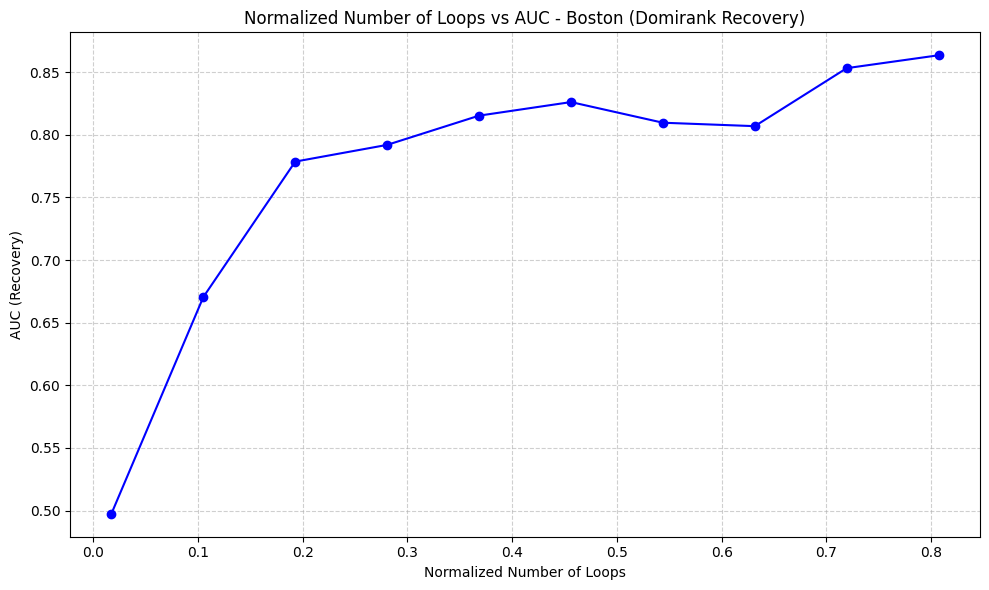

In [96]:
import os
import pickle
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import random

# Load the networks
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

def increase_loops_to_target_nl(G, target_nl):
    G_mod = G.copy()
    num_nodes = G_mod.number_of_nodes()
    
    while len(nx.cycle_basis(G_mod)) / num_nodes < target_nl:
        u, v = random.sample(list(G_mod.nodes()), 2)
        if not G_mod.has_edge(u, v):
            G_mod.add_edge(u, v)
        if not nx.is_connected(G_mod):
            G_mod.remove_edge(u, v)  # Prevent disconnection
    
    return G_mod

# Choose the target city
city_name = "Boston"  # Change the city name here
G = networks[city_name]
print(f"\n▶ Processing {city_name}...")

# Calculate original number of loops
original_loops = len(nx.cycle_basis(G))
num_nodes = G.number_of_nodes()
original_nl = original_loops / num_nodes
print(f"Original Loops: {original_loops}, Normalized Loops: {original_nl:.4f}")

# Set target NL range (from original to 0.5 in 10 steps)
nl_steps = np.linspace(original_nl, 0.8, 10)

nl_values = []
auc_values = []

for target_nl in nl_steps:
    G_modified = increase_loops_to_target_nl(G, target_nl)
    nl = len(nx.cycle_basis(G_modified)) / num_nodes
    nl_values.append(nl)
    nodes_to_remove = list(G_modified.nodes())
    np.random.shuffle(nodes_to_remove)
    # Simulate recovery using Domirank
    recovery_perf, _ = simulate_recovery_domirank(G_modified, nodes_to_remove)
    auc = plot_area_recovery(recovery_perf, "Domirank")
    auc_values.append(auc)
    print(f"Target NL: {nl:.4f}, AUC: {auc:.4f}")

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(nl_values, auc_values, marker='o', linestyle='-', color='blue')
plt.title(f"Normalized Number of Loops vs AUC - {city_name} (Domirank Recovery)")
plt.xlabel("Normalized Number of Loops")
plt.ylabel("AUC (Recovery)")
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
# plt.savefig(f"visuals_for_paper/{city_name}_recovery_NL_vs_AUC.png", dpi=300)
plt.show()


In [33]:
# === Utility to calculate area under the recovery curve ===
def plot_area_recovery(recovery_performance, label):
    if not recovery_performance or max(recovery_performance) == 0:
        return 0.0
    max_ratio = max(recovery_performance)
    scaled = [val / max_ratio for val in recovery_performance]
    steps = list(range(1, len(scaled) + 1))
    area = np.trapz(scaled, steps)
    normalized = area / len(scaled)
    # print(f"Normalized area under the {label} recovery curve: {normalized:.2f}")
    return float(normalized)


Running recovery loop augmentation for Boston...


 20%|██        | 2/10 [00:00<00:00, 14.92it/s]

Boston | Target NL: 0.018 → Actual: 0.018 | AUC: 0.4974 ± 0.0000
 → Attributes Snapshot: {'Edges': 115, 'Normalized_Loops': 0.017543859649122806}
Boston AUC increase at each step: []
Boston | Target NL: 0.071 → Actual: 0.079 | AUC: 0.6937 ± 0.0483
 → Attributes Snapshot: {'Edges': 122, 'Normalized_Loops': 0.07894736842105263}
Boston AUC increase at each step: [0.1963]
Boston | Target NL: 0.125 → Actual: 0.132 | AUC: 0.7290 ± 0.0136
 → Attributes Snapshot: {'Edges': 128, 'Normalized_Loops': 0.13157894736842105}
Boston AUC increase at each step: [0.1963, 0.0353]


 40%|████      | 4/10 [00:00<00:00, 12.47it/s]

Boston | Target NL: 0.178 → Actual: 0.184 | AUC: 0.7623 ± 0.0106
 → Attributes Snapshot: {'Edges': 134, 'Normalized_Loops': 0.18421052631578946}
Boston AUC increase at each step: [0.1963, 0.0353, 0.0332]
Boston | Target NL: 0.232 → Actual: 0.237 | AUC: 0.7698 ± 0.0109
 → Attributes Snapshot: {'Edges': 140, 'Normalized_Loops': 0.23684210526315788}
Boston AUC increase at each step: [0.1963, 0.0353, 0.0332, 0.0076]


 60%|██████    | 6/10 [00:00<00:00, 10.37it/s]

Boston | Target NL: 0.286 → Actual: 0.289 | AUC: 0.7959 ± 0.0090
 → Attributes Snapshot: {'Edges': 146, 'Normalized_Loops': 0.2894736842105263}
Boston AUC increase at each step: [0.1963, 0.0353, 0.0332, 0.0076, 0.0261]
Boston | Target NL: 0.339 → Actual: 0.342 | AUC: 0.7986 ± 0.0067
 → Attributes Snapshot: {'Edges': 152, 'Normalized_Loops': 0.34210526315789475}
Boston AUC increase at each step: [0.1963, 0.0353, 0.0332, 0.0076, 0.0261, 0.0027]


 90%|█████████ | 9/10 [00:00<00:00,  7.94it/s]

Boston | Target NL: 0.393 → Actual: 0.395 | AUC: 0.8142 ± 0.0094
 → Attributes Snapshot: {'Edges': 158, 'Normalized_Loops': 0.39473684210526316}
Boston AUC increase at each step: [0.1963, 0.0353, 0.0332, 0.0076, 0.0261, 0.0027, 0.0156]
Boston | Target NL: 0.446 → Actual: 0.447 | AUC: 0.8171 ± 0.0066
 → Attributes Snapshot: {'Edges': 164, 'Normalized_Loops': 0.4473684210526316}
Boston AUC increase at each step: [0.1963, 0.0353, 0.0332, 0.0076, 0.0261, 0.0027, 0.0156, 0.0029]


100%|██████████| 10/10 [00:01<00:00,  8.44it/s]


Boston | Target NL: 0.500 → Actual: 0.500 | AUC: 0.8236 ± 0.0057
 → Attributes Snapshot: {'Edges': 170, 'Normalized_Loops': 0.5}
Boston AUC increase at each step: [0.1963, 0.0353, 0.0332, 0.0076, 0.0261, 0.0027, 0.0156, 0.0029, 0.0065]

Running recovery loop augmentation for Lisbon...


 40%|████      | 4/10 [00:00<00:00, 31.67it/s]

Lisbon | Target NL: 0.060 → Actual: 0.060 | AUC: 0.7514 ± 0.0000
 → Attributes Snapshot: {'Edges': 52, 'Normalized_Loops': 0.06}
Lisbon AUC increase at each step: []
Lisbon | Target NL: 0.109 → Actual: 0.120 | AUC: 0.7695 ± 0.0103
 → Attributes Snapshot: {'Edges': 55, 'Normalized_Loops': 0.12}
Lisbon AUC increase at each step: [0.0182]
Lisbon | Target NL: 0.158 → Actual: 0.160 | AUC: 0.7643 ± 0.0095
 → Attributes Snapshot: {'Edges': 57, 'Normalized_Loops': 0.16}
Lisbon AUC increase at each step: [0.0182, -0.0052]
Lisbon | Target NL: 0.207 → Actual: 0.220 | AUC: 0.7839 ± 0.0112
 → Attributes Snapshot: {'Edges': 60, 'Normalized_Loops': 0.22}
Lisbon AUC increase at each step: [0.0182, -0.0052, 0.0196]
Lisbon | Target NL: 0.256 → Actual: 0.260 | AUC: 0.7987 ± 0.0089
 → Attributes Snapshot: {'Edges': 62, 'Normalized_Loops': 0.26}
Lisbon AUC increase at each step: [0.0182, -0.0052, 0.0196, 0.0148]
Lisbon | Target NL: 0.304 → Actual: 0.320 | AUC: 0.8072 ± 0.0112
 → Attributes Snapshot: {'Edge

 80%|████████  | 8/10 [00:00<00:00, 21.81it/s]

Lisbon | Target NL: 0.353 → Actual: 0.360 | AUC: 0.8140 ± 0.0048
 → Attributes Snapshot: {'Edges': 67, 'Normalized_Loops': 0.36}
Lisbon AUC increase at each step: [0.0182, -0.0052, 0.0196, 0.0148, 0.0084, 0.0068]
Lisbon | Target NL: 0.402 → Actual: 0.420 | AUC: 0.8248 ± 0.0081
 → Attributes Snapshot: {'Edges': 70, 'Normalized_Loops': 0.42}
Lisbon AUC increase at each step: [0.0182, -0.0052, 0.0196, 0.0148, 0.0084, 0.0068, 0.0108]
Lisbon | Target NL: 0.451 → Actual: 0.460 | AUC: 0.8336 ± 0.0060
 → Attributes Snapshot: {'Edges': 72, 'Normalized_Loops': 0.46}
Lisbon AUC increase at each step: [0.0182, -0.0052, 0.0196, 0.0148, 0.0084, 0.0068, 0.0108, 0.0088]


100%|██████████| 10/10 [00:00<00:00, 19.43it/s]

Lisbon | Target NL: 0.500 → Actual: 0.500 | AUC: 0.8284 ± 0.0078
 → Attributes Snapshot: {'Edges': 74, 'Normalized_Loops': 0.5}
Lisbon AUC increase at each step: [0.0182, -0.0052, 0.0196, 0.0148, 0.0084, 0.0068, 0.0108, 0.0088, -0.0052]



Running recovery loop augmentation for Warsaw...


 40%|████      | 4/10 [00:00<00:00, 39.43it/s]

Warsaw | Target NL: 0.000 → Actual: 0.000 | AUC: 0.6956 ± 0.0000
 → Attributes Snapshot: {'Edges': 32, 'Normalized_Loops': 0.0}
Warsaw AUC increase at each step: []
Warsaw | Target NL: 0.056 → Actual: 0.061 | AUC: 0.7155 ± 0.0182
 → Attributes Snapshot: {'Edges': 34, 'Normalized_Loops': 0.06060606060606061}
Warsaw AUC increase at each step: [0.0199]
Warsaw | Target NL: 0.111 → Actual: 0.121 | AUC: 0.7396 ± 0.0197
 → Attributes Snapshot: {'Edges': 36, 'Normalized_Loops': 0.12121212121212122}
Warsaw AUC increase at each step: [0.0199, 0.0241]
Warsaw | Target NL: 0.167 → Actual: 0.182 | AUC: 0.7606 ± 0.0145
 → Attributes Snapshot: {'Edges': 38, 'Normalized_Loops': 0.18181818181818182}
Warsaw AUC increase at each step: [0.0199, 0.0241, 0.021]
Warsaw | Target NL: 0.222 → Actual: 0.242 | AUC: 0.7861 ± 0.0141
 → Attributes Snapshot: {'Edges': 40, 'Normalized_Loops': 0.24242424242424243}
Warsaw AUC increase at each step: [0.0199, 0.0241, 0.021, 0.0255]
Warsaw | Target NL: 0.278 → Actual: 0.303

 80%|████████  | 8/10 [00:00<00:00, 32.94it/s]

Warsaw | Target NL: 0.389 → Actual: 0.394 | AUC: 0.7972 ± 0.0122
 → Attributes Snapshot: {'Edges': 45, 'Normalized_Loops': 0.3939393939393939}
Warsaw AUC increase at each step: [0.0199, 0.0241, 0.021, 0.0255, 0.0102, 0.0041, -0.0032]
Warsaw | Target NL: 0.444 → Actual: 0.455 | AUC: 0.8152 ± 0.0107
 → Attributes Snapshot: {'Edges': 47, 'Normalized_Loops': 0.45454545454545453}
Warsaw AUC increase at each step: [0.0199, 0.0241, 0.021, 0.0255, 0.0102, 0.0041, -0.0032, 0.0179]
Warsaw | Target NL: 0.500 → Actual: 0.515 | AUC: 0.8184 ± 0.0075
 → Attributes Snapshot: {'Edges': 49, 'Normalized_Loops': 0.5151515151515151}
Warsaw AUC increase at each step: [0.0199, 0.0241, 0.021, 0.0255, 0.0102, 0.0041, -0.0032, 0.0179, 0.0033]


100%|██████████| 10/10 [00:00<00:00, 30.56it/s]



Running recovery loop augmentation for London...


 10%|█         | 1/10 [00:00<00:03,  2.45it/s]

London | Target NL: 0.168 → Actual: 0.168 | AUC: 0.7423 ± 0.0000
 → Attributes Snapshot: {'Edges': 430, 'Normalized_Loops': 0.16802168021680217}
London AUC increase at each step: []


 20%|██        | 2/10 [00:00<00:03,  2.52it/s]

London | Target NL: 0.205 → Actual: 0.206 | AUC: 0.7722 ± 0.0045
 → Attributes Snapshot: {'Edges': 444, 'Normalized_Loops': 0.20596205962059622}
London AUC increase at each step: [0.0299]


 30%|███       | 3/10 [00:01<00:03,  2.29it/s]

London | Target NL: 0.242 → Actual: 0.244 | AUC: 0.7928 ± 0.0055
 → Attributes Snapshot: {'Edges': 458, 'Normalized_Loops': 0.24390243902439024}
London AUC increase at each step: [0.0299, 0.0206]


 40%|████      | 4/10 [00:01<00:02,  2.08it/s]

London | Target NL: 0.279 → Actual: 0.279 | AUC: 0.8073 ± 0.0046
 → Attributes Snapshot: {'Edges': 471, 'Normalized_Loops': 0.2791327913279133}
London AUC increase at each step: [0.0299, 0.0206, 0.0145]


 50%|█████     | 5/10 [00:02<00:02,  1.84it/s]

London | Target NL: 0.316 → Actual: 0.317 | AUC: 0.8170 ± 0.0033
 → Attributes Snapshot: {'Edges': 485, 'Normalized_Loops': 0.3170731707317073}
London AUC increase at each step: [0.0299, 0.0206, 0.0145, 0.0097]


 60%|██████    | 6/10 [00:03<00:02,  1.66it/s]

London | Target NL: 0.352 → Actual: 0.355 | AUC: 0.8208 ± 0.0047
 → Attributes Snapshot: {'Edges': 499, 'Normalized_Loops': 0.35501355013550134}
London AUC increase at each step: [0.0299, 0.0206, 0.0145, 0.0097, 0.0038]


 70%|███████   | 7/10 [00:04<00:02,  1.45it/s]

London | Target NL: 0.389 → Actual: 0.390 | AUC: 0.8289 ± 0.0052
 → Attributes Snapshot: {'Edges': 512, 'Normalized_Loops': 0.3902439024390244}
London AUC increase at each step: [0.0299, 0.0206, 0.0145, 0.0097, 0.0038, 0.0082]


 80%|████████  | 8/10 [00:05<00:01,  1.21it/s]

London | Target NL: 0.426 → Actual: 0.428 | AUC: 0.8337 ± 0.0027
 → Attributes Snapshot: {'Edges': 526, 'Normalized_Loops': 0.4281842818428184}
London AUC increase at each step: [0.0299, 0.0206, 0.0145, 0.0097, 0.0038, 0.0082, 0.0048]


 90%|█████████ | 9/10 [00:06<00:00,  1.10it/s]

London | Target NL: 0.463 → Actual: 0.463 | AUC: 0.8361 ± 0.0030
 → Attributes Snapshot: {'Edges': 539, 'Normalized_Loops': 0.4634146341463415}
London AUC increase at each step: [0.0299, 0.0206, 0.0145, 0.0097, 0.0038, 0.0082, 0.0048, 0.0024]


100%|██████████| 10/10 [00:07<00:00,  1.31it/s]


London | Target NL: 0.500 → Actual: 0.501 | AUC: 0.8397 ± 0.0029
 → Attributes Snapshot: {'Edges': 553, 'Normalized_Loops': 0.5013550135501355}
London AUC increase at each step: [0.0299, 0.0206, 0.0145, 0.0097, 0.0038, 0.0082, 0.0048, 0.0024, 0.0036]

Running recovery loop augmentation for NewYork...


 10%|█         | 1/10 [00:00<00:04,  1.88it/s]

NewYork | Target NL: 0.104 → Actual: 0.104 | AUC: 0.6934 ± 0.0000
 → Attributes Snapshot: {'Edges': 510, 'Normalized_Loops': 0.10367170626349892}
NewYork AUC increase at each step: []


 20%|██        | 2/10 [00:01<00:04,  1.71it/s]

NewYork | Target NL: 0.148 → Actual: 0.149 | AUC: 0.7435 ± 0.0052
 → Attributes Snapshot: {'Edges': 531, 'Normalized_Loops': 0.1490280777537797}
NewYork AUC increase at each step: [0.0501]


 30%|███       | 3/10 [00:01<00:04,  1.58it/s]

NewYork | Target NL: 0.192 → Actual: 0.192 | AUC: 0.7637 ± 0.0037
 → Attributes Snapshot: {'Edges': 551, 'Normalized_Loops': 0.19222462203023757}
NewYork AUC increase at each step: [0.0501, 0.0202]


 40%|████      | 4/10 [00:02<00:04,  1.29it/s]

NewYork | Target NL: 0.236 → Actual: 0.238 | AUC: 0.7853 ± 0.0049
 → Attributes Snapshot: {'Edges': 572, 'Normalized_Loops': 0.23758099352051837}
NewYork AUC increase at each step: [0.0501, 0.0202, 0.0216]


 50%|█████     | 5/10 [00:03<00:04,  1.13it/s]

NewYork | Target NL: 0.280 → Actual: 0.281 | AUC: 0.7999 ± 0.0029
 → Attributes Snapshot: {'Edges': 592, 'Normalized_Loops': 0.28077753779697623}
NewYork AUC increase at each step: [0.0501, 0.0202, 0.0216, 0.0146]


 60%|██████    | 6/10 [00:05<00:04,  1.02s/it]

NewYork | Target NL: 0.324 → Actual: 0.324 | AUC: 0.8080 ± 0.0030
 → Attributes Snapshot: {'Edges': 612, 'Normalized_Loops': 0.32397408207343414}
NewYork AUC increase at each step: [0.0501, 0.0202, 0.0216, 0.0146, 0.0082]


 70%|███████   | 7/10 [00:06<00:03,  1.17s/it]

NewYork | Target NL: 0.368 → Actual: 0.369 | AUC: 0.8148 ± 0.0036
 → Attributes Snapshot: {'Edges': 633, 'Normalized_Loops': 0.3693304535637149}
NewYork AUC increase at each step: [0.0501, 0.0202, 0.0216, 0.0146, 0.0082, 0.0068]


 80%|████████  | 8/10 [00:08<00:02,  1.39s/it]

NewYork | Target NL: 0.412 → Actual: 0.413 | AUC: 0.8193 ± 0.0027
 → Attributes Snapshot: {'Edges': 653, 'Normalized_Loops': 0.41252699784017277}
NewYork AUC increase at each step: [0.0501, 0.0202, 0.0216, 0.0146, 0.0082, 0.0068, 0.0045]


 90%|█████████ | 9/10 [00:10<00:01,  1.56s/it]

NewYork | Target NL: 0.456 → Actual: 0.458 | AUC: 0.8277 ± 0.0037
 → Attributes Snapshot: {'Edges': 674, 'Normalized_Loops': 0.45788336933045354}
NewYork AUC increase at each step: [0.0501, 0.0202, 0.0216, 0.0146, 0.0082, 0.0068, 0.0045, 0.0085]


100%|██████████| 10/10 [00:12<00:00,  1.26s/it]

NewYork | Target NL: 0.500 → Actual: 0.501 | AUC: 0.8333 ± 0.0043
 → Attributes Snapshot: {'Edges': 694, 'Normalized_Loops': 0.5010799136069114}
NewYork AUC increase at each step: [0.0501, 0.0202, 0.0216, 0.0146, 0.0082, 0.0068, 0.0045, 0.0085, 0.0056]


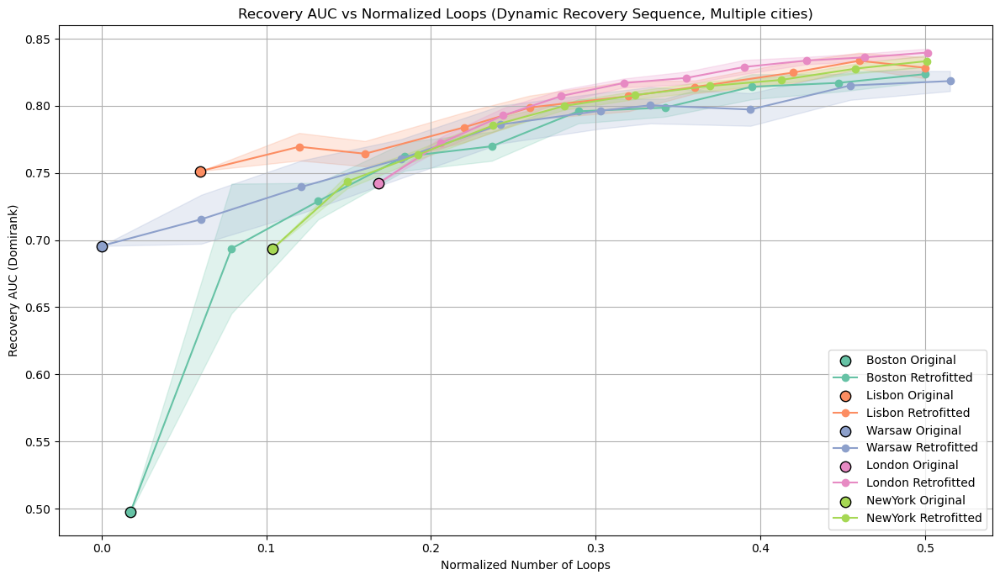

In [38]:
import pickle
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import seaborn as sns

# Load networks
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

# === Utility Functions ===
def normalized_loops(G):
    return len(nx.cycle_basis(G)) / G.number_of_nodes()

def increase_loops(G, target_nl, max_attempts=20000):
    G_mod = G.copy()
    attempts = 0
    while normalized_loops(G_mod) < target_nl and attempts < max_attempts:
        u, v = np.random.choice(list(G_mod.nodes()), 2, replace=False)
        if not G_mod.has_edge(u, v) and nx.has_path(G_mod, u, v):
            G_mod.add_edge(u, v)
        attempts += 1
    return G_mod

def compute_attributes(G):
    if nx.is_connected(G):
        largest_cc = G
    else:
        largest_cc_nodes = max(nx.connected_components(G), key=len)
        largest_cc = G.subgraph(largest_cc_nodes).copy()

    return {
        # "Nodes": G.number_of_nodes(),
        "Edges": G.number_of_edges(),
        # "Density": nx.density(G),
        # "Diameter": nx.diameter(largest_cc),
        # "Modularity": nx.community.modularity(G, list(nx.community.label_propagation_communities(G))),
        # "Clustering_Coefficient": nx.average_clustering(G),
        # "Assortativity": nx.degree_assortativity_coefficient(G),
        # "Global_Efficiency": nx.global_efficiency(G),
        # "Avg_SPL": nx.average_shortest_path_length(largest_cc),
        "Normalized_Loops": normalized_loops(G)
    }


# === Choose Cities ===
target_cities = ["Boston", "Lisbon", "Warsaw", "London", "NewYork"]

colors = sns.color_palette("Set2", len(target_cities))
plt.figure(figsize=(12, 7))
results = []

for idx, city in enumerate(target_cities):
    print(f"\nRunning recovery loop augmentation for {city}...")
    G_city = networks[city]
    nl_orig = normalized_loops(G_city)
    nl_steps = np.linspace(nl_orig, 0.5, 10)

    perf_original, _ = simulate_recovery_domirank(G_city, list(G_city.nodes()))
    auc_original = plot_area_recovery(perf_original, "recovery")

    nl_vals, auc_means, auc_lows, auc_highs = [], [], [], []

    for target_nl in tqdm(nl_steps):
        aucs = []
        attr_snapshot = None
        for run in range(10):
            G_mod = increase_loops(G_city, target_nl)
            perf, _ = simulate_recovery_domirank(G_mod, list(G_mod.nodes()))
            auc = plot_area_recovery(perf, "recovery")
            aucs.append(auc)

            if run == 9:
                attr_snapshot = compute_attributes(G_mod)

        aucs = np.array(aucs)
        mean_auc = aucs.mean()
        std_err = aucs.std(ddof=1) / np.sqrt(len(aucs))
        ci = 1.96 * std_err

        actual_nl = normalized_loops(G_mod)
        nl_vals.append(actual_nl)
        auc_means.append(mean_auc)
        auc_lows.append(mean_auc - ci)
        auc_highs.append(mean_auc + ci)

        print(f"{city} | Target NL: {target_nl:.3f} → Actual: {actual_nl:.3f} | AUC: {mean_auc:.4f} ± {ci:.4f}")
        print(" → Attributes Snapshot:", attr_snapshot)

        # === Print per-step delta AUC ===
        auc_deltas = [round(auc_means[i + 1] - auc_means[i], 4) for i in range(len(auc_means) - 1)]
        print(f"{city} AUC increase at each step: {auc_deltas}")

    if len(nl_vals) >= 2:
        delta_y = auc_means[-1] - auc_means[0]
        delta_x = nl_vals[-1] - nl_vals[0]
        avg_gradient = delta_y / delta_x if delta_x != 0 else float('inf')
        results.append((city, avg_gradient))

    color = colors[idx]
    plt.scatter([nl_orig], [auc_original], color=color, edgecolor='black', s=80, zorder=5, label=f"{city} Original")
    plt.plot(nl_vals, auc_means, color=color, marker='o', label=f"{city} Retrofitted")
    plt.fill_between(nl_vals, auc_lows, auc_highs, color=color, alpha=0.2)

# Final Plot
plt.xlabel("Normalized Number of Loops")
plt.ylabel("Recovery AUC (Domirank)")
plt.title("Recovery AUC vs Normalized Loops (Dynamic Recovery Sequence, Multiple cities)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [100]:
# results_sorted = sorted(results, key=lambda x: x[1])
sorted(results, key=lambda x: x[1])

[('BuenosAires', 0.1521028991425071),
 ('Marseille', 0.16619047619047603),
 ('Lyon', 0.16739409499358168),
 ('Tokyo', 0.1737080627705625),
 ('Madrid', 0.1756236564515323),
 ('Copenhagen', 0.17597222222222203),
 ('Paris', 0.1811073660557543),
 ('Lisbon', 0.19527629233511626),
 ('Budapest', 0.19538598047914815),
 ('Vienna', 0.20762385762385777),
 ('Berlin', 0.21236734693877518),
 ('Nuremberg', 0.21341666666666612),
 ('Philadelphia', 0.2287925696594429),
 ('Naples', 0.22917771883289115),
 ('SanFrancisco', 0.24109121909633457),
 ('Cairo', 0.24231182795698902),
 ('Warsaw', 0.24394463667820082),
 ('Shanghai', 0.2449879576107897),
 ('Prague', 0.24842615012106561),
 ('Athens', 0.25255839822024495),
 ('Chicago', 0.25764957264957283),
 ('Toronto', 0.26326458036984396),
 ('Delhi', 0.26542195668409224),
 ('Amsterdam', 0.26597222222222155),
 ('WashingtonDc', 0.276036400404449),
 ('Toulouse', 0.2767313019390582),
 ('Lille', 0.28145845110231726),
 ('Rotterdam', 0.28185584092792065),
 ('Bilbao', 0.289

In [181]:
def simulate_recovery_fixed_sequence(G, fixed_sequence):
    """
    Reconstructs the graph using a fixed node recovery sequence and 
    records the normalized performance after each step.

    Parameters:
    - G: Original full graph (used to fetch node and edge info)
    - fixed_sequence: List of nodes to add back in fixed order

    Returns:
    - recovery_performance: List of normalized performance values after each node addition
    """
    H = nx.Graph()
    recovery_performance = []

    initial_performance = calculate_network_performance(G)
    recovery_performance.append(calculate_network_performance(H) / initial_performance)

    for node in fixed_sequence:
        H.add_node(node, **G.nodes[node])
        H.add_edges_from(G.edges(node))  # Add all edges from original G connected to 'node'
        curr_perf = calculate_network_performance(H)
        recovery_performance.append(curr_perf / initial_performance if initial_performance > 0 else 0)

    return recovery_performance



=== Processing Boston ===
Normalized area under the recovery recovery curve: 0.50
Boston original NL: 0.018 | original AUC: 0.4974


  0%|          | 0/10 [00:00<?, ?it/s]

Normalized area under the recovery recovery curve: 0.50
Normalized area under the recovery recovery curve: 0.50
Normalized area under the recovery recovery curve: 0.50
Normalized area under the recovery recovery curve: 0.50
Normalized area under the recovery recovery curve: 0.50
Normalized area under the recovery recovery curve: 0.50
Normalized area under the recovery recovery curve: 0.50
Normalized area under the recovery recovery curve: 0.50
Normalized area under the recovery recovery curve: 0.50
Normalized area under the recovery recovery curve: 0.50
Boston | Target NL: 0.018 → Actual: 0.018 | AUC: 0.4974 ± 0.0000


 50%|█████     | 5/10 [00:00<00:00, 12.74it/s]

Normalized area under the recovery recovery curve: 0.72
Normalized area under the recovery recovery curve: 0.71
Normalized area under the recovery recovery curve: 0.69
Normalized area under the recovery recovery curve: 0.69
Normalized area under the recovery recovery curve: 0.68
Normalized area under the recovery recovery curve: 0.69
Normalized area under the recovery recovery curve: 0.72
Normalized area under the recovery recovery curve: 0.67
Normalized area under the recovery recovery curve: 0.72
Normalized area under the recovery recovery curve: 0.69
Boston | Target NL: 0.071 → Actual: 0.079 | AUC: 0.6990 ± 0.0108
Normalized area under the recovery recovery curve: 0.76
Normalized area under the recovery recovery curve: 0.69
Normalized area under the recovery recovery curve: 0.74
Normalized area under the recovery recovery curve: 0.72
Normalized area under the recovery recovery curve: 0.73
Normalized area under the recovery recovery curve: 0.68
Normalized area under the recovery reco

 70%|███████   | 7/10 [00:00<00:00, 12.31it/s]

Normalized area under the recovery recovery curve: 0.74
Normalized area under the recovery recovery curve: 0.76
Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery recovery curve: 0.73
Normalized area under the recovery recovery curve: 0.76
Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.74
Boston | Target NL: 0.286 → Actual: 0.289 | AUC: 0.7527 ± 0.0076
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.76
Normalized area under the recovery recovery curve: 0.76
Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery reco

100%|██████████| 10/10 [00:00<00:00, 10.45it/s]


Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.77
Boston | Target NL: 0.500 → Actual: 0.500 | AUC: 0.7853 ± 0.0080

=== Processing Lisbon ===
Normalized area under the recovery recovery curve: 0.75
Lisbon original NL: 0.060 | original AUC: 0.7514


  0%|          | 0/10 [00:00<?, ?it/s]

Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.75
Lisbon | Target NL: 0.060 → Actual: 0.060 | AUC: 0.7514 ± 0.0000
Normalized area under the recovery recovery curve: 0.76
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.76
Normalized area under the recovery recovery curve: 0.76
Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery reco

100%|██████████| 10/10 [00:00<00:00, 51.27it/s]


Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.82
Lisbon | Target NL: 0.353 → Actual: 0.360 | AUC: 0.8011 ± 0.0089
Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.82
Normalized area under the recovery recovery curve: 0.81
Lisbon | Target NL: 0.402 → Actual: 0.420 | AUC: 0.7933 ± 0.0094
Normalized area under the recovery recovery curve: 0.84
Normalized area under the recovery recovery curve: 0.82
Normalized area under the recovery recovery curve: 0.83
Normalized area under the reco

  0%|          | 0/10 [00:00<?, ?it/s]

Normalized area under the recovery recovery curve: 0.70
Normalized area under the recovery recovery curve: 0.70
Normalized area under the recovery recovery curve: 0.70
Normalized area under the recovery recovery curve: 0.70
Normalized area under the recovery recovery curve: 0.70
Normalized area under the recovery recovery curve: 0.70
Normalized area under the recovery recovery curve: 0.70
Normalized area under the recovery recovery curve: 0.70
Normalized area under the recovery recovery curve: 0.70
Normalized area under the recovery recovery curve: 0.70
Warsaw | Target NL: 0.000 → Actual: 0.000 | AUC: 0.6956 ± 0.0000
Normalized area under the recovery recovery curve: 0.70
Normalized area under the recovery recovery curve: 0.70
Normalized area under the recovery recovery curve: 0.72
Normalized area under the recovery recovery curve: 0.73
Normalized area under the recovery recovery curve: 0.71
Normalized area under the recovery recovery curve: 0.70
Normalized area under the recovery reco

100%|██████████| 10/10 [00:00<00:00, 89.27it/s]



=== Processing London ===
Normalized area under the recovery recovery curve: 0.74
London original NL: 0.168 | original AUC: 0.7423


  0%|          | 0/10 [00:00<?, ?it/s]

Normalized area under the recovery recovery curve: 0.74
Normalized area under the recovery recovery curve: 0.74
Normalized area under the recovery recovery curve: 0.74
Normalized area under the recovery recovery curve: 0.74
Normalized area under the recovery recovery curve: 0.74
Normalized area under the recovery recovery curve: 0.74
Normalized area under the recovery recovery curve: 0.74


 10%|█         | 1/10 [00:00<00:02,  3.17it/s]

Normalized area under the recovery recovery curve: 0.74
Normalized area under the recovery recovery curve: 0.74
Normalized area under the recovery recovery curve: 0.74
London | Target NL: 0.168 → Actual: 0.168 | AUC: 0.7423 ± 0.0000
Normalized area under the recovery recovery curve: 0.76
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.76
Normalized area under the recovery recovery curve: 0.76
Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery recovery curve: 0.76
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.76
London | Target NL: 0.205 → Actual: 0.206 | AUC: 0.7586 ± 0.0033


 20%|██        | 2/10 [00:00<00:02,  2.84it/s]

Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.79
London | Target NL: 0.242 → Actual: 0.244 | AUC: 0.7787 ± 0.0041


 30%|███       | 3/10 [00:01<00:02,  2.51it/s]

Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.78


 40%|████      | 4/10 [00:01<00:02,  2.20it/s]

Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.78
London | Target NL: 0.279 → Actual: 0.279 | AUC: 0.7849 ± 0.0039
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.79


 50%|█████     | 5/10 [00:02<00:02,  1.94it/s]

Normalized area under the recovery recovery curve: 0.79
London | Target NL: 0.316 → Actual: 0.317 | AUC: 0.7942 ± 0.0034
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.79


 60%|██████    | 6/10 [00:02<00:02,  1.74it/s]

Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.80
London | Target NL: 0.352 → Actual: 0.355 | AUC: 0.8026 ± 0.0046
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.82
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.80
London | Target NL: 0.389 → Actual: 0.390 | AUC: 0.8070 ± 0.0040


 70%|███████   | 7/10 [00:03<00:01,  1.55it/s]

Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.82
Normalized area under the recovery recovery curve: 0.83
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.82
Normalized area under the recovery recovery curve: 0.83
Normalized area under the recovery recovery curve: 0.82


 80%|████████  | 8/10 [00:04<00:01,  1.38it/s]

Normalized area under the recovery recovery curve: 0.82
Normalized area under the recovery recovery curve: 0.81
London | Target NL: 0.426 → Actual: 0.428 | AUC: 0.8160 ± 0.0051
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.82
Normalized area under the recovery recovery curve: 0.82
Normalized area under the recovery recovery curve: 0.82
Normalized area under the recovery recovery curve: 0.82
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.83
Normalized area under the recovery recovery curve: 0.82
Normalized area under the recovery recovery curve: 0.83


 90%|█████████ | 9/10 [00:05<00:00,  1.24it/s]

Normalized area under the recovery recovery curve: 0.82
London | Target NL: 0.463 → Actual: 0.463 | AUC: 0.8206 ± 0.0038
Normalized area under the recovery recovery curve: 0.82
Normalized area under the recovery recovery curve: 0.83
Normalized area under the recovery recovery curve: 0.82
Normalized area under the recovery recovery curve: 0.83
Normalized area under the recovery recovery curve: 0.83
Normalized area under the recovery recovery curve: 0.83
Normalized area under the recovery recovery curve: 0.83


100%|██████████| 10/10 [00:06<00:00,  1.46it/s]


Normalized area under the recovery recovery curve: 0.83
Normalized area under the recovery recovery curve: 0.83
Normalized area under the recovery recovery curve: 0.82
London | Target NL: 0.500 → Actual: 0.501 | AUC: 0.8251 ± 0.0028

=== Processing NewYork ===
Normalized area under the recovery recovery curve: 0.69
NewYork original NL: 0.104 | original AUC: 0.6934


  0%|          | 0/10 [00:00<?, ?it/s]

Normalized area under the recovery recovery curve: 0.69
Normalized area under the recovery recovery curve: 0.69
Normalized area under the recovery recovery curve: 0.69
Normalized area under the recovery recovery curve: 0.69
Normalized area under the recovery recovery curve: 0.69
Normalized area under the recovery recovery curve: 0.69
Normalized area under the recovery recovery curve: 0.69
Normalized area under the recovery recovery curve: 0.69
Normalized area under the recovery recovery curve: 0.69


 10%|█         | 1/10 [00:00<00:04,  2.18it/s]

Normalized area under the recovery recovery curve: 0.69
NewYork | Target NL: 0.104 → Actual: 0.104 | AUC: 0.6934 ± 0.0000
Normalized area under the recovery recovery curve: 0.73
Normalized area under the recovery recovery curve: 0.71
Normalized area under the recovery recovery curve: 0.71
Normalized area under the recovery recovery curve: 0.73
Normalized area under the recovery recovery curve: 0.74
Normalized area under the recovery recovery curve: 0.74
Normalized area under the recovery recovery curve: 0.72
Normalized area under the recovery recovery curve: 0.74


 20%|██        | 2/10 [00:01<00:04,  1.94it/s]

Normalized area under the recovery recovery curve: 0.73
Normalized area under the recovery recovery curve: 0.72
NewYork | Target NL: 0.148 → Actual: 0.149 | AUC: 0.7272 ± 0.0063
Normalized area under the recovery recovery curve: 0.74
Normalized area under the recovery recovery curve: 0.74
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.74
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.76
Normalized area under the recovery recovery curve: 0.72


 30%|███       | 3/10 [00:01<00:04,  1.72it/s]

Normalized area under the recovery recovery curve: 0.74
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.74
NewYork | Target NL: 0.192 → Actual: 0.192 | AUC: 0.7440 ± 0.0067
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.76
Normalized area under the recovery recovery curve: 0.75
Normalized area under the recovery recovery curve: 0.76
Normalized area under the recovery recovery curve: 0.76


 40%|████      | 4/10 [00:02<00:04,  1.48it/s]

Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery recovery curve: 0.76
Normalized area under the recovery recovery curve: 0.76
Normalized area under the recovery recovery curve: 0.75
NewYork | Target NL: 0.236 → Actual: 0.238 | AUC: 0.7558 ± 0.0033
Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.76
Normalized area under the recovery recovery curve: 0.78


 50%|█████     | 5/10 [00:03<00:03,  1.27it/s]

Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery recovery curve: 0.77
NewYork | Target NL: 0.280 → Actual: 0.281 | AUC: 0.7722 ± 0.0036
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery recovery curve: 0.77
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.78


 60%|██████    | 6/10 [00:04<00:03,  1.09it/s]

Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.78
NewYork | Target NL: 0.324 → Actual: 0.324 | AUC: 0.7762 ± 0.0025
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.78
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.79


 70%|███████   | 7/10 [00:06<00:03,  1.11s/it]

Normalized area under the recovery recovery curve: 0.78
NewYork | Target NL: 0.368 → Actual: 0.369 | AUC: 0.7876 ± 0.0027
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.79


 80%|████████  | 8/10 [00:07<00:02,  1.28s/it]

Normalized area under the recovery recovery curve: 0.80
NewYork | Target NL: 0.412 → Actual: 0.413 | AUC: 0.7920 ± 0.0037
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.79
Normalized area under the recovery recovery curve: 0.81


 90%|█████████ | 9/10 [00:09<00:01,  1.47s/it]

Normalized area under the recovery recovery curve: 0.81
NewYork | Target NL: 0.456 → Actual: 0.458 | AUC: 0.8010 ± 0.0045
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.80
Normalized area under the recovery recovery curve: 0.79


100%|██████████| 10/10 [00:11<00:00,  1.19s/it]

Normalized area under the recovery recovery curve: 0.81
Normalized area under the recovery recovery curve: 0.81
NewYork | Target NL: 0.500 → Actual: 0.501 | AUC: 0.8043 ± 0.0033


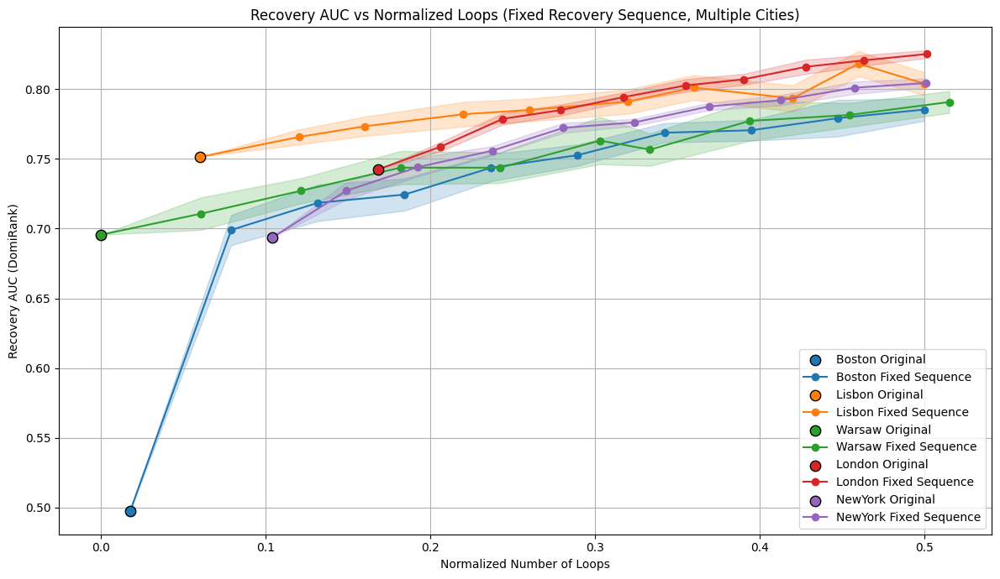

In [187]:
import pickle
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import seaborn as sns

# Load networks
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)


# Cities to include
target_cities = ["Boston","Lisbon", "Warsaw", "London", "NewYork"]
                 # "Lisbon", "London"]
colors = sns.color_palette("tab10", len(target_cities))

plt.figure(figsize=(12, 7))

for idx, city in enumerate(target_cities):
    print(f"\n=== Processing {city} ===")
    G_city = networks[city]
    nl_orig = normalized_loops(G_city)

    # Get original fixed recovery sequence
    node_list = list(G_city.nodes())
    _, recovery_seq = simulate_recovery_domirank(G_city, node_list)
    perf_orig, _ = simulate_recovery_domirank(G_city, node_list)
    auc_orig = plot_area_recovery(perf_orig, "recovery")

    print(f"{city} original NL: {nl_orig:.3f} | original AUC: {auc_orig:.4f}")

    # Create steps
    max_target_nl = 0.5
    nl_steps = np.linspace(nl_orig, max_target_nl, 10)

    # Track values
    nl_vals = []
    auc_means = []
    auc_lows = []
    auc_highs = []

    # Loop over NL targets
    for target_nl in tqdm(nl_steps):
        aucs = []
        for _ in range(10):
            G_mod = increase_loops(G_city, target_nl)
            perf = simulate_recovery_fixed_sequence(G_mod, recovery_seq)
            auc = plot_area_recovery(perf, "recovery")
            aucs.append(auc)

        aucs = np.array(aucs)
        mean_auc = aucs.mean()
        std_err = aucs.std(ddof=1) / np.sqrt(len(aucs))
        ci = 1.96 * std_err

        nl_actual = normalized_loops(G_mod)
        nl_vals.append(nl_actual)
        auc_means.append(mean_auc)
        auc_lows.append(mean_auc - ci)
        auc_highs.append(mean_auc + ci)

        print(f"{city} | Target NL: {target_nl:.3f} → Actual: {nl_actual:.3f} | AUC: {mean_auc:.4f} ± {ci:.4f}")

    # Plot
    color = colors[idx]
    plt.scatter([nl_orig], [auc_orig], color=color, edgecolor='black', s=80, label=f"{city} Original", zorder=5)
    plt.plot(nl_vals, auc_means, color=color, marker='o', label=f"{city} Fixed Sequence")
    plt.fill_between(nl_vals, auc_lows, auc_highs, color=color, alpha=0.2)

# Final plot settings
plt.xlabel("Normalized Number of Loops")
plt.ylabel("Recovery AUC (DomiRank)")
plt.title("Recovery AUC vs Normalized Loops (Fixed Recovery Sequence, Multiple Cities)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


## Using specific nodes

In [38]:
import pickle
import networkx as nx
import folium

# === Load the graph dictionary ===
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

# Select Boston graph
G_B = networks["Boston"]

# Extract node positions (lat/lon)
pos_dict = {
    node: (data["lat"], data["lon"])
    for node, data in G_B.nodes(data=True)
    if "lat" in data and "lon" in data
}

# Compute map center
latitudes = [lat for lat, lon in pos_dict.values()]
longitudes = [lon for lat, lon in pos_dict.values()]
center_lat = sum(latitudes) / len(latitudes)
center_lon = sum(longitudes) / len(longitudes)

# Initialize Folium map
m = folium.Map(location=[center_lat, center_lon], zoom_start=12, tiles='CartoDB positron')

# Add edges
for u, v in G_B.edges():
    if u in pos_dict and v in pos_dict:
        lat_lon_u = pos_dict[u]
        lat_lon_v = pos_dict[v]
        folium.PolyLine(
            locations=[lat_lon_u, lat_lon_v],
            color='gray',
            weight=2,
            opacity=0.7
        ).add_to(m)

# Add nodes
for node_id, (lat, lon) in pos_dict.items():
    folium.CircleMarker(
        location=[lat, lon],
        radius=5,
        color='black',
        fill=True,
        fill_color='black',
        fill_opacity=0.8,
        tooltip=f'Node {node_id}'
    ).add_to(m)

# Show map
m


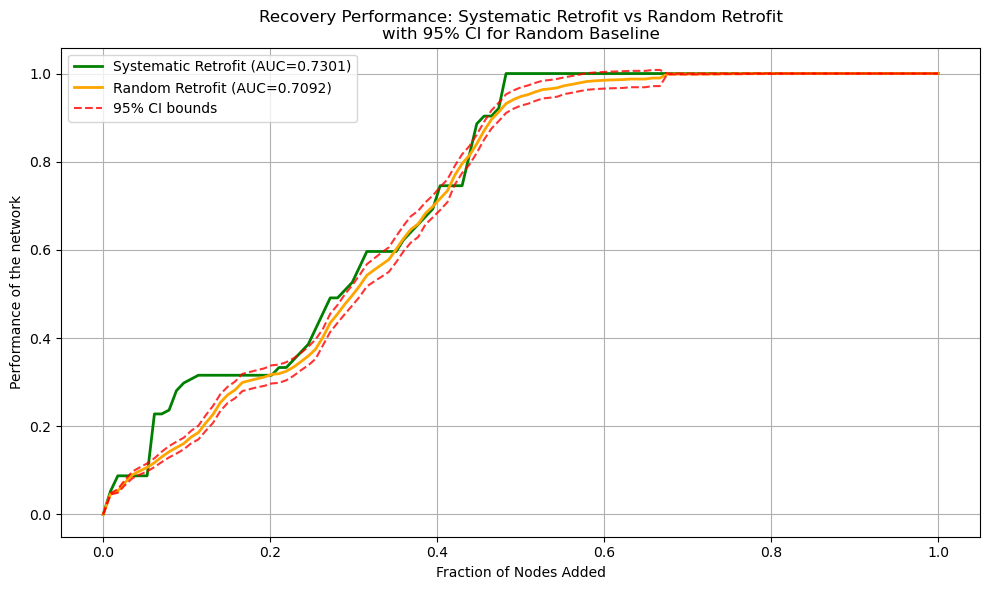

✅ AUC with retrofit edges: 0.7301
🎲 Mean AUC with random edges over 50 trials: 0.7092


In [34]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# Base graph
G_base = G_B.copy()
sigma = 1.0
nodes_to_remove = np.random.choice(list(G_base.nodes()), size=int(sigma*len(G_base)), replace=False)

# Retrofit edges (fixed)
retrofit_edges = [(24,10), (10,36), (36,58), (58,61), (61,34), (34,66), (24,10)]

# Function to compute recovery curve and AUC
def compute_recovery(G, label):
    perf, _ = simulate_recovery_domirank(G, nodes_to_remove)
    auc = plot_area_recovery(perf, label)
    return perf, auc

# 1️⃣ Retrofit version
G_retrofit = G_base.copy()
G_retrofit.add_edges_from(retrofit_edges)
perf_retrofit, auc_retrofit = compute_recovery(G_retrofit, "Retrofit")

# 2️⃣ Random baseline: average over multiple runs
def add_random_edges(G, num_edges=7, max_attempts=5000):
    G_rand = G.copy()
    attempts = 0
    nodes = list(G.nodes())
    added = 0
    while added < num_edges and attempts < max_attempts:
        u, v = np.random.choice(nodes, 2, replace=False)
        if not G_rand.has_edge(u, v):
            G_rand.add_edge(u, v)
            added += 1
        attempts += 1
    return G_rand

random_trials = 50
perf_random_all = []
auc_random_all = []

for _ in range(random_trials):
    G_rand = add_random_edges(G_base, num_edges=len(retrofit_edges))
    perf, auc = compute_recovery(G_rand, label=None)
    perf_random_all.append(perf)
    auc_random_all.append(auc)

perf_random_all = np.array(perf_random_all)
perf_random_mean = np.mean(perf_random_all, axis=0)
auc_random_mean = np.mean(auc_random_all)

# 95% Confidence Interval for random baseline (per step of recovery)
confidence = 0.95
n = random_trials
stderr = stats.sem(perf_random_all, axis=0)
h = stderr * stats.t.ppf((1 + confidence) / 2., n - 1)
ci_lower = perf_random_mean - h
ci_upper = perf_random_mean + h

# 3️⃣ Plot both
plt.figure(figsize=(10, 6))
x = np.linspace(0, 1, len(perf_retrofit))

plt.plot(x, perf_retrofit, label=f"Systematic Retrofit (AUC={auc_retrofit:.4f})", color='green', lw=2)
plt.plot(x, perf_random_mean, label=f"Random Retrofit (AUC={auc_random_mean:.4f})", color='orange', lw=2)

# 95% CI bounds as dashed red lines
plt.plot(x, ci_lower, '--', color='red', alpha=0.8, label='95% CI bounds')
plt.plot(x, ci_upper, '--', color='red', alpha=0.8)

plt.xlabel("Fraction of Nodes Added")
plt.ylabel("Performance of the network")
plt.title("Recovery Performance: Systematic Retrofit vs Random Retrofit\nwith 95% CI for Random Baseline")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("retrofitting_figures/recovery_retrofitting_resilience_curve.svg",
            format='svg', dpi=300, bbox_inches='tight')
plt.show()

# 4️⃣ Print results
print(f"✅ AUC with retrofit edges: {auc_retrofit:.4f}")
print(f"🎲 Mean AUC with random edges over {random_trials} trials: {auc_random_mean:.4f}")


In [43]:
import pickle
import networkx as nx
import folium
import numpy as np

# === Load the graph dictionary ===
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

# Select Rome graph
G_B = networks["Boston"]

# Extract node positions (lat/lon)
pos_dict = {
    node: (data["lat"], data["lon"])
    for node, data in G_B.nodes(data=True)
    if "lat" in data and "lon" in data
}

# Retrofit path 1
retrofit_edges = [(24,10) , (10,36) , (36,58), (58,61) , (61,34), (34,66), (24,10)]

# Function to generate random non-existing edges
def get_random_edges(G, num_edges=0, max_attempts=5000):
    nodes = list(G.nodes())
    edges = set(G.edges())
    random_edges = set()
    attempts = 0
    while len(random_edges) < num_edges and attempts < max_attempts:
        u, v = np.random.choice(nodes, 2, replace=False)
        if (u, v) not in edges and (v, u) not in edges and (u, v) not in random_edges and (v, u) not in random_edges:
            random_edges.add((u, v))
        attempts += 1
    return list(random_edges)

random_edges = get_random_edges(G_B,6)

# Compute map center
latitudes = [lat for lat, lon in pos_dict.values()]
longitudes = [lon for lat, lon in pos_dict.values()]
center_lat = sum(latitudes) / len(latitudes)
center_lon = sum(longitudes) / len(longitudes)

# Initialize Folium map
m = folium.Map(location=[center_lat, center_lon], zoom_start=12, tiles='CartoDB positron')

# Original edges in gray
for u, v in G_B.edges():
    if u in pos_dict and v in pos_dict:
        folium.PolyLine(
            locations=[pos_dict[u], pos_dict[v]],
            color='gray',
            weight=2,
            opacity=0.6
        ).add_to(m)

# Retrofit edges in red
for u, v in retrofit_edges:
    if u in pos_dict and v in pos_dict:
        folium.PolyLine(
            locations=[pos_dict[u], pos_dict[v]],
            color='red',
            weight=3,
            opacity=0.9
        ).add_to(m)

# # Random edges in blue
# for u, v in random_edges:
#     if u in pos_dict and v in pos_dict:
#         folium.PolyLine(
#             locations=[pos_dict[u], pos_dict[v]],
#             color='blue',
#             weight=3,
#             opacity=0.9
#         ).add_to(m)

# Node markers
for node_id, (lat, lon) in pos_dict.items():
    folium.CircleMarker(
        location=(lat, lon),
        radius=3,
        color='black',
        fill=True,
        fill_opacity=0.7,
        popup=f"Node ID: {node_id}",
        tooltip=str(node_id)
    ).add_to(m)

# Display the map
m


In [ ]:
# ===== Static Boston map with basemap background =====
import os
import pickle
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import contextily as ctx
from shapely.geometry import LineString, Point
import matplotlib.patches as mpatches

# ---------- Load graphs ----------
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

G_B = networks["Boston"]

# ---------- Node coordinates ----------
pos_dict = {
    n: (d["lon"], d["lat"])  # shapely uses (x=lon, y=lat)
    for n, d in G_B.nodes(data=True)
    if "lat" in d and "lon" in d
}

# ---------- Retrofit edges ----------
retrofit_edges = [(24,10) , (10,36) , (36,58), (58,61) , (61,34), (34,66), (24,10)]

# ---------- Build GeoDataFrames ----------
edge_geoms = [
    LineString([pos_dict[u], pos_dict[v]])
    for u, v in G_B.edges()
    if u in pos_dict and v in pos_dict
]
gdf_edges = gpd.GeoDataFrame(geometry=edge_geoms, crs="EPSG:4326")

retrofit_geoms = [
    LineString([pos_dict[u], pos_dict[v]])
    for u, v in retrofit_edges
    if u in pos_dict and v in pos_dict
]
gdf_retro = gpd.GeoDataFrame(geometry=retrofit_geoms, crs="EPSG:4326")

node_points = [Point(lon, lat) for lon, lat in pos_dict.values()]
gdf_nodes = gpd.GeoDataFrame({"node_id": list(pos_dict.keys())}, geometry=node_points, crs="EPSG:4326")

# ---------- Project to Web Mercator ----------
gdf_edges_plt = gdf_edges.to_crs(epsg=3857)
gdf_retro_plt = gdf_retro.to_crs(epsg=3857)
gdf_nodes_plt = gdf_nodes.to_crs(epsg=3857)

# ---------- Plot ----------
fig, ax = plt.subplots(figsize=(8, 8))

# Plot basemap first
xmin, ymin, xmax, ymax = gdf_nodes_plt.total_bounds
dx, dy = xmax - xmin, ymax - ymin
buffer_x, buffer_y = 0.05 * dx, 0.05 * dy
ax.set_xlim(xmin - buffer_x, xmax + buffer_x)
ax.set_ylim(ymin - buffer_y, ymax + buffer_y)

# Add basemap (Carto light gray)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.PositronNoLabels)

# Plot original edges
gdf_edges_plt.plot(ax=ax, color="#8f8f8f", linewidth=0.8, alpha=0.8, zorder=2)

# Retrofit links
if len(gdf_retro_plt) > 0:
    gdf_retro_plt.plot(ax=ax, color="#d7191c", linewidth=2.2, alpha=0.95, zorder=3)

# Nodes
gdf_nodes_plt.plot(ax=ax, color="black", markersize=6, zorder=4)

# Remove axes
ax.set_axis_off()

# Save to requested path
save_path = "/retrofitting_figures/boston_retrofit_map_recovery.svg"
os.makedirs(os.path.dirname(save_path), exist_ok=True)
plt.savefig(save_path, format="svg", dpi=600, bbox_inches="tight", pad_inches=0.02)
plt.show()

print(f"✅ Saved map with background to: {save_path}")
